# Index

* [Image Alignment and Combination](#Image_Alignment_and_Combination)
    * [Calibration](#Calibration)
    * [Flats](#Flats)
    * [Q1](#Q1): Why are there hot pixels in the dark-subtracted science data?
    * [Alignment](#Alignment)
    * [Exercises](#Exercise1)
* [RGB Images](#RGB_Images)
    * [Exercises](#Exercise2)
    


# RGB Alignment and Combination <a name="Image_Alignment_and_Combination"></a>


[Index](#Index)

We discussed in class that _median combination_ can be used to eliminate outliers.  However, you can only combine images if they're aligned - if the tracking is bad and you try to median-combine images, you'll find that the stars disappear!  In our case, the tracking isn't _that_ bad, but the stars are still not well-aligned.

Median combining will generally eliminate cosmic rays, which is the main reason to do it.

Let's look at an example of this, starting with raw data (we haven't subtracted darks or divided by the flat field).

In this exercise, you will:
    
* Reduce & process data as in the Data Reduction notebooks
* Observe the effects of tracking and pointing errors
* Recognize where correctable errors were made during the data acquisition process
* Align images that are slightly shifted
* Use median combination to clean out cosmic rays

When you complete the RGB part of the exercise (bottom), you'll end up with this image:

<img src="RGB_Goal.png">

In [1]:
%matplotlib
%matplotlib inline 
%matplotlib notebook  
import numpy as np
import pylab as pl
import matplotlib.pyplot as plt
pl.rcParams['image.origin'] = 'lower' # make images display right-side-up
pl.style.use('dark_background')

Using matplotlib backend: <object object at 0x10825b000>


In [2]:
import glob
from astropy.io import fits

In [3]:
filenames = glob.glob("StarsNearNGCTopLeft_V*.FIT")
images = [fits.getdata(fn) for fn in filenames]

In [4]:
raw_median_combined_images = np.median(images, axis=0)

<IPython.core.display.Javascript object>


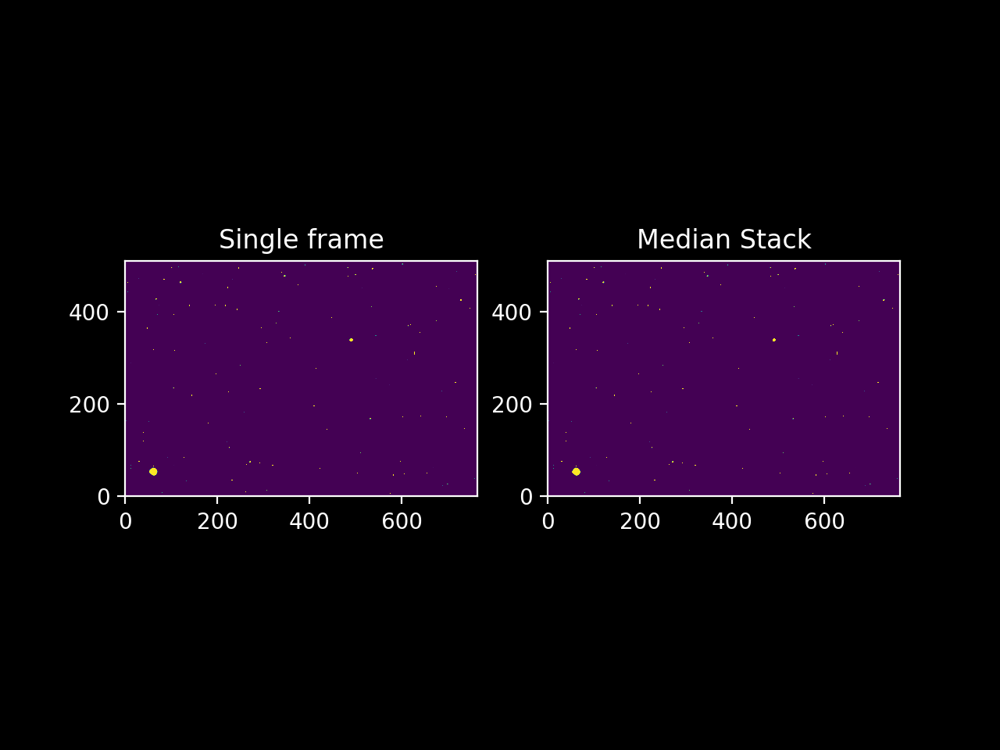

In [5]:
pl.subplot(1, 2, 1) 
pl.imshow(images[1], origin='lower', vmax=2170, vmin=1860)  # Plot image
pl.title("Single frame")
pl.subplot(1, 2, 2)
pl.imshow(raw_median_combined_images, origin='lower', vmax=2170, vmin=1860)
pl.title("Median Stack")

pl.show()

Look closely at the region around x$\sim$620, y$\sim$150

<IPython.core.display.Javascript object>


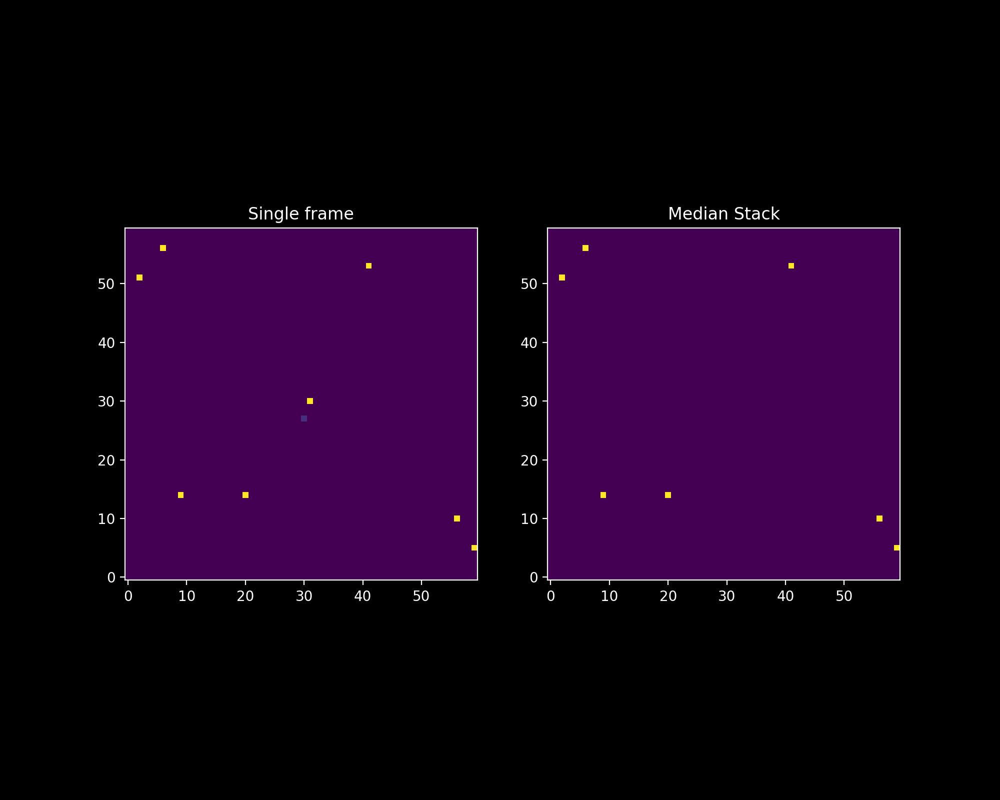

Text(0.5, 1.0, 'Median Stack')

In [6]:
pl.figure(figsize=(10,8))
pl.subplot(1,2,1).imshow(images[1][120:180,600:660], origin='lower', vmax=2170, vmin=1860)
pl.title("Single frame")

pl.subplot(1,2,2).imshow(raw_median_combined_images[120:180,600:660], origin='lower', vmax=2170, vmin=1860)
pl.title("Median Stack")


Note that the cosmic ray hit has (almost) completely disappeared!

Now let's look closely at a star, comparing the three frames and their median.

<IPython.core.display.Javascript object>


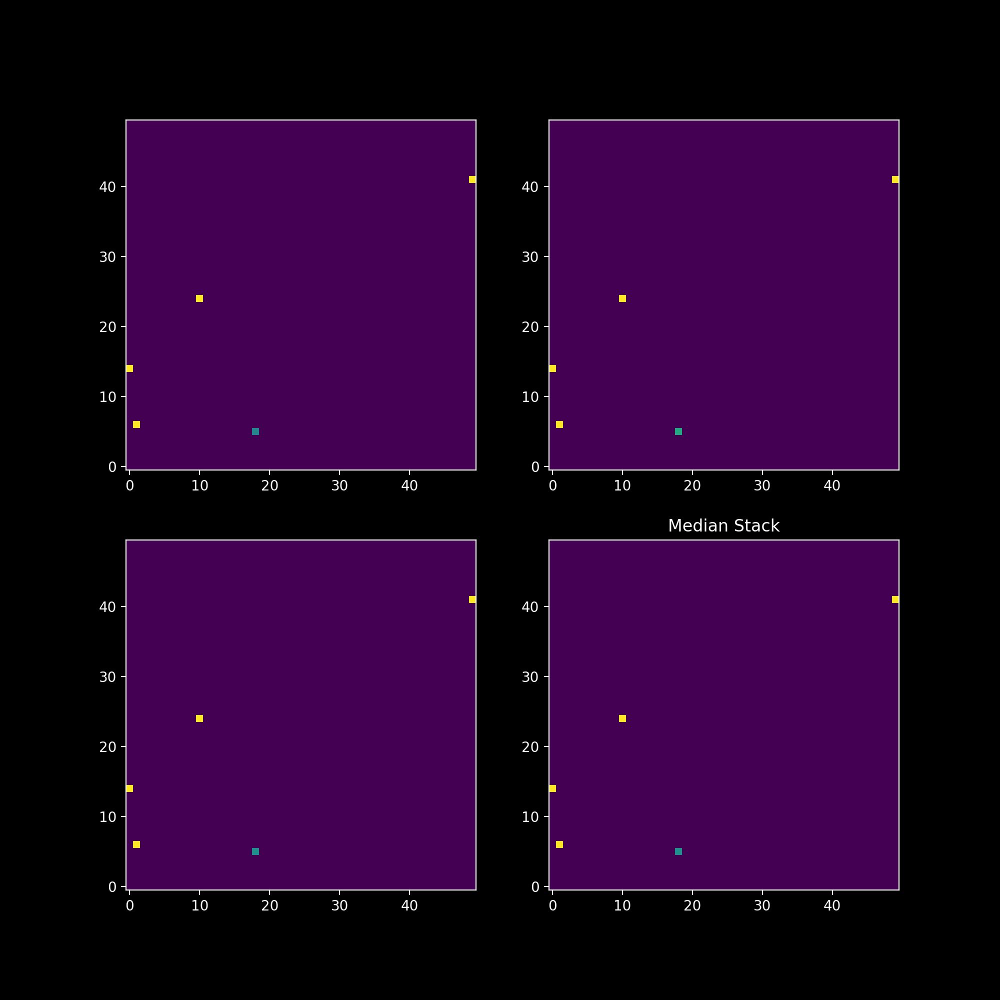

Text(0.5, 1.0, 'Median Stack')

In [7]:
pl.figure(figsize=(10,10))

for ii in range(3):
    pl.subplot(2,2,ii+1).imshow(images[ii][320:370,360:410], origin='lower', vmax=2170, vmin=1860)

pl.subplot(2,2,4).imshow(raw_median_combined_images[320:370,360:410], origin='lower', vmax=2170, vmin=1860)
pl.title("Median Stack")


If we mark an 'x' at pixel x,y = 385,345, we can see how the stars move around a little.  

However, since we're using small cutouts, the bottom-left corner has moved!  Therefore, we don't plot at x=385, y=345, we plot at (x-x0) = (385-360) = 25, (y-y0) = (345-320) = 25.  In other words, the X we're plotting is _relative_ to the bottom-left corner.

<IPython.core.display.Javascript object>


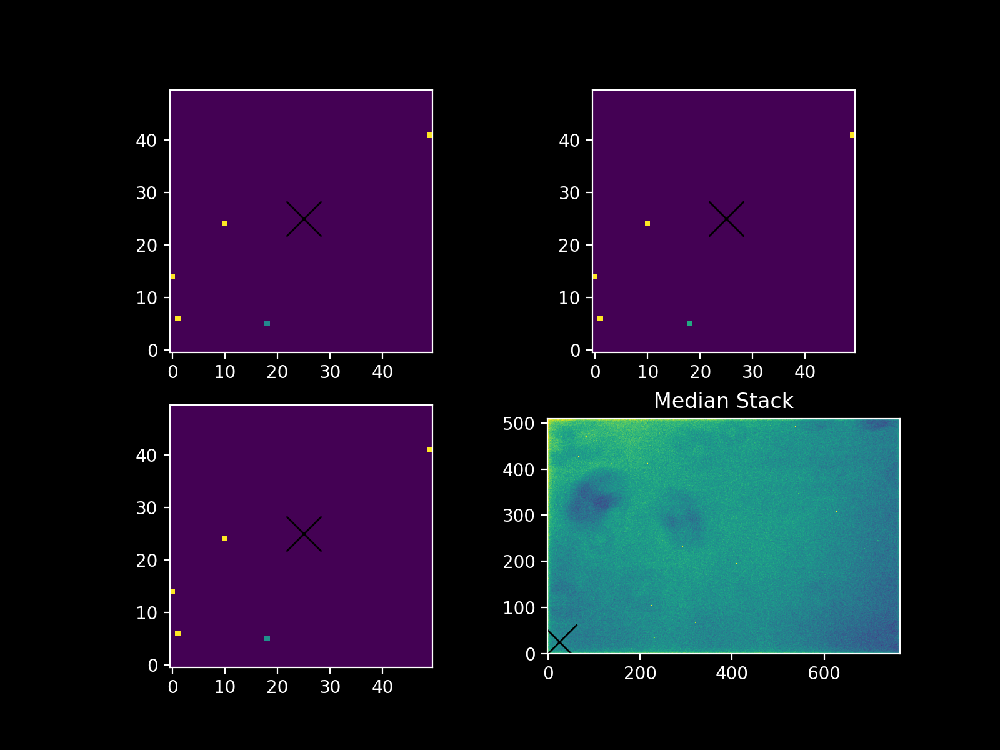

Text(0.5, 1.0, 'Median Stack')

In [8]:
pl.figure(figsize=(8,6))

for ii in range(3):
    ax = pl.subplot(2,2,ii+1)
    ax.imshow(images[ii][320:370,360:410], origin='lower', vmax=2170, vmin=1860)
    ax.plot(25, 25, 'kx', markersize=20)

ax = pl.subplot(2,2,4)
ax.imshow(raw_median_combined_images[320:370,360:410], origin='lower', vmax=2170, vmin=1860)
ax.plot(25, 25, 'kx', markersize=20)

ax.set_title("Median Stack")


The stars are jittering around!

You can also see that the median image is a little fainter than it should be.

We can correct for these errors, but we do first have to calibrate the data.

# Calibration

[Index](#Index)

In [9]:
dark_30s_filenames = glob.glob('Dark_30s_02*FIT')
flat_v_filenames = glob.glob('Flats_V_10s_*FIT')
bias_filenames = glob.glob('Bias_02*FIT')

In [10]:
bias_filenames

['Bias_02_12_2020009.FIT',
 'Bias_02_12_2020008.FIT',
 'Bias_02_12_2020001.FIT',
 'Bias_02_12_2020003.FIT',
 'Bias_02_12_2020002.FIT',
 'Bias_02_12_2020006.FIT',
 'Bias_02_12_2020007.FIT',
 'Bias_02_12_2020005.FIT',
 'Bias_02_12_2020004.FIT',
 'Bias_02_12_2020010.FIT']

In [11]:
dark_30s_filenames

['Dark_30s_02_12_2020004.FIT',
 'Dark_30s_02_12_2020010.FIT',
 'Dark_30s_02_12_2020005.FIT',
 'Dark_30s_02_12_2020007.FIT',
 'Dark_30s_02_12_2020006.FIT',
 'Dark_30s_02_12_2020002.FIT',
 'Dark_30s_02_12_2020003.FIT',
 'Dark_30s_02_12_2020001.FIT',
 'Dark_30s_02_12_2020008.FIT',
 'Dark_30s_02_12_2020009.FIT']

We median-stack all the darks & biases to eliminate their cosmic rays:

In [12]:
median_bias = np.median([fits.getdata(fn) for fn in bias_filenames], axis=0)
median_dark_30s = np.median([fits.getdata(fn) for fn in dark_30s_filenames], axis=0)

In [13]:
std_bias = np.std([fits.getdata(fn) for fn in bias_filenames], axis=0)
print(f"median and mean readnoise: {np.median(std_bias):0.1f}, {np.mean(std_bias):0.1f} +/- {np.std(std_bias):0.1f}")

median and mean readnoise: 10.0, 10.1 +/- 2.5


In [14]:
median_dark_current_rate = np.median((median_dark_30s - median_bias) / 30)
print(f"Dark current rate: {median_dark_current_rate:0.2f}, median dark cts in 30s: {np.median(median_dark_30s - median_bias):0.1f}")

Dark current rate: 0.13, median dark cts in 30s: 4.0


# Flats

[Index](#Index)

We average the flats instead of median combining because the flats are taken in variable lighting.  If we took the median over several frames, and the sky was getting brighter from one frame to the next, the median would just select the middle frame and we'd get no benefits from the repeat exposures.

In [15]:
average_flat_v = np.mean([fits.getdata(fn) for fn in flat_v_filenames], axis=0)

For the flats, we can subtract only the bias (if you have them, it's better to subtract darks of the same exposure time, though).

In [16]:
average_flat_v_biassub = average_flat_v - median_bias

Then we mean-normalize the flat:

In [17]:
average_flat_v_biassub_norm = average_flat_v_biassub / average_flat_v_biassub.mean()

In [18]:
pl.imshow(average_flat_v_biassub_norm, origin='lower', vmin=0.95, vmax=1.05)

The science images are 30s exposures, so we subtract the median 30s dark from each of those (median because darks can have cosmic ray hits).

Then, we divide by the normalized flat

In [19]:
darksub_science_images = [im - median_dark_30s for im in images]
flat_darksub_science_images = [im / average_flat_v_biassub_norm for im in darksub_science_images]

In [20]:
processed_median_combined_images = np.median(flat_darksub_science_images, axis=0)

<IPython.core.display.Javascript object>


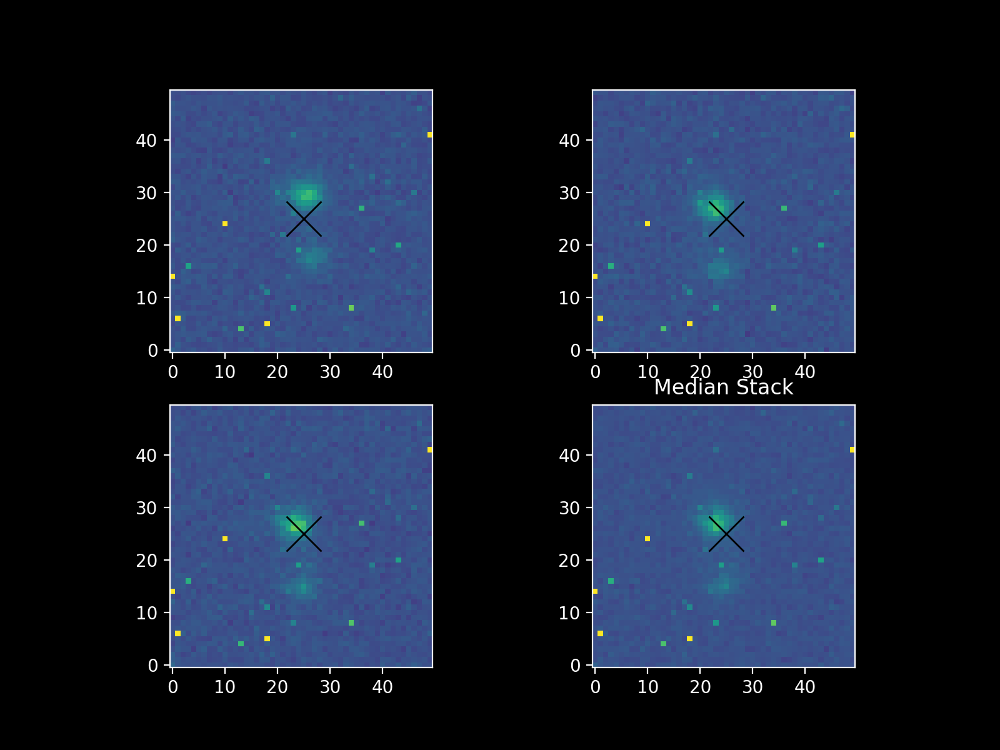

Text(0.5, 1.0, 'Median Stack')

In [21]:
pl.figure(figsize=(8,6))

for ii in range(3):
    ax = pl.subplot(2,2,ii+1)
    ax.imshow(flat_darksub_science_images[ii][320:370,360:410], origin='lower', vmax=750, vmin=0)
    ax.plot(25, 25, 'kx', markersize=20)

ax = pl.subplot(2,2,4)
ax.imshow(processed_median_combined_images[320:370,360:410], origin='lower', vmax=750, vmin=0)
ax.plot(25, 25, 'kx', markersize=20)

ax.set_title("Median Stack")

In [22]:
sci_header = fits.getheader("StarsNearNGCTopLeft_V_30s_02_12_2020001.FIT")
dark_header = fits.getheader("Dark_30s_02_12_2020001.FIT") 
gain = sci_header.get('GAIN', 'N/A')
readnoise = sci_header.get('READNOISE', 'N/A')

print(f"Gain: {gain}")
print(f"Read Noise: {readnoise}")


print(f"Science Exposure Time: {sci_header['EXPTIME']} s")
print(f"Dark Frame Exposure Time: {dark_header['EXPTIME']} s")


Gain: N/A
Read Noise: N/A
Science Exposure Time: 30.0 s
Dark Frame Exposure Time: 30.0 s


The processed images above don't look particularly good - there are a bunch of hot pixels!

Why did this happen?  


A: Hot pixels are from the dark current in the CCD that accumulates during exposure even when no light is hitting the sensor. The exposures are both the same so I can't conclude that the difference in exposure times could have influenced the dark current. Temperature, gain, and read noise do not call any values either. This leads me to belive that because all the images display hot pixels that possibly hot pixels remain in the dark images because they weren't collected properly or maybe the external factors changed the conditions slightly that made the darks and science frames unable to match properly. This could also be from the flat fielding frames for not identifying the hot pixels to get rid of them.

Hints:
 * You can inspect the headers of the images to see some information about how the data were taken.
 * What factors affect how much dark current the CCD records?
 * Notice that the individual images (each of the flat-field-corrected, dark-subtracted science images) exhibits hot pixels.

## Q1

[Index](#Index)

Why are there hot pixels in the dark-subtracted science data?

A:Hot pixels are in dark-subtracted science images from leftover hot pixels in the dark frames. The hot pixels did not get properly removed in the subtraction process. This is probably from the dark frame not perfectly matched to the science image for temperature or slightly other varying conditions. Flat-field corrections might not fully remove hot pixels if they were present in the flat frames too. 


# Alignment
[Index](#Index)

The next step is to align the images.

To do this, we estimate how far each image is shifted from each other.

As a first pass, we can just "eyeball" the offset by looking at the images:

<IPython.core.display.Javascript object>


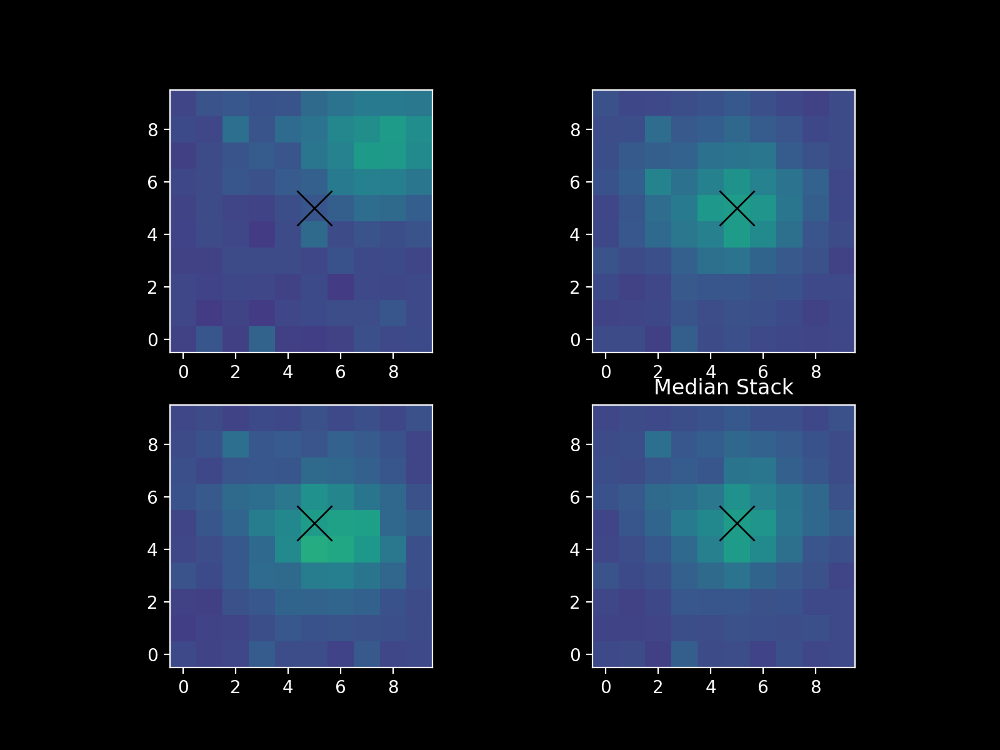

Text(0.5, 1.0, 'Median Stack')

In [23]:
pl.figure(figsize=(8,6))

for ii in range(3):
    ax = pl.subplot(2,2,ii+1)
    ax.imshow(flat_darksub_science_images[ii][342:352,378:388], origin='lower', vmax=930, vmin=0)
    ax.plot(5, 5, 'kx', markersize=20)

ax = pl.subplot(2,2,4)
ax.imshow(processed_median_combined_images[342:352,378:388], origin='lower', vmax=930, vmin=0)
ax.plot(5, 5, 'kx', markersize=20)

ax.set_title("Median Stack")

We can see that the positions are off by a few pixels each:
* the top-left image is about 3 pixels left and 3 pixels down from the top-right image
* the bottom-left image is about 1 pixel up from the top-right image, but they are aligned left-right

Note that there is not a perfect "center" pixel, just approximate ones!

To add the images together (or median combine them), they all have to be exactly the same size.

How can we shift the images?  There are two ways we can consider:

(1) We could crop each image so they're the same size, then stack them on top of each other.

(2) We could "roll" the images such that the leftmost pixel becomes the rightmost, and every other pixel shifts by 1 space from right-to-left (or, by $n$ spaces).  If we do this, the edges of the image will be useless - we can crop them later.


We'll go with the 'roll' approach:

In [24]:
# for image zero, the top-left image, we "roll" back three pixels in each dimension
im0 = np.roll(np.roll(flat_darksub_science_images[2], -3, axis=0), -3, axis=1)
im1 = flat_darksub_science_images[1] # this is our "reference image", it stays put

# the bottom-left image, im2, only needs to "roll" on the Y-axis
im2 = np.roll(flat_darksub_science_images[0], 1, axis=0)
rolled_images = [im0,im1,im2]
rolled_median = np.median(rolled_images, axis=0)


<IPython.core.display.Javascript object>


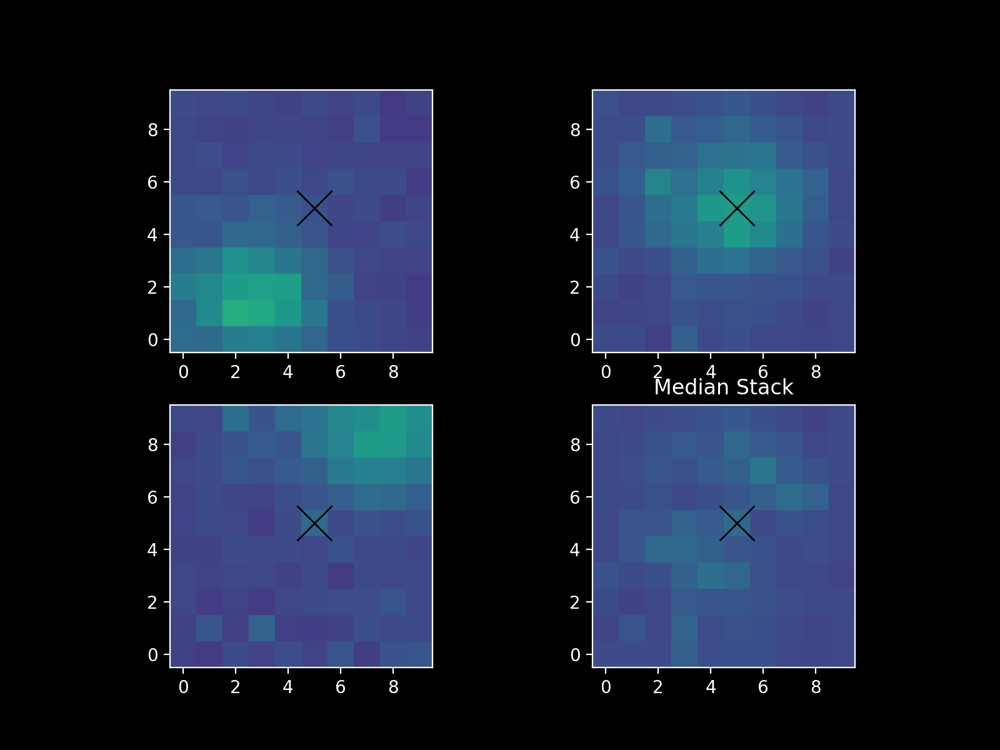

Text(0.5, 1.0, 'Median Stack')

In [25]:
pl.figure(figsize=(8,6))

for ii in range(3):
    ax = pl.subplot(2,2,ii+1)
    ax.imshow(rolled_images[ii][342:352,378:388], origin='lower', vmax=930, vmin=0)
    ax.plot(5, 5, 'kx', markersize=20)

ax = pl.subplot(2,2,4)
ax.imshow(rolled_median[342:352,378:388], origin='lower', vmax=930, vmin=0)
ax.plot(5, 5, 'kx', markersize=20)

ax.set_title("Median Stack")

The alignment is better, but not perfect.

We can see more interesting effects if we zoom back out a little:

<IPython.core.display.Javascript object>


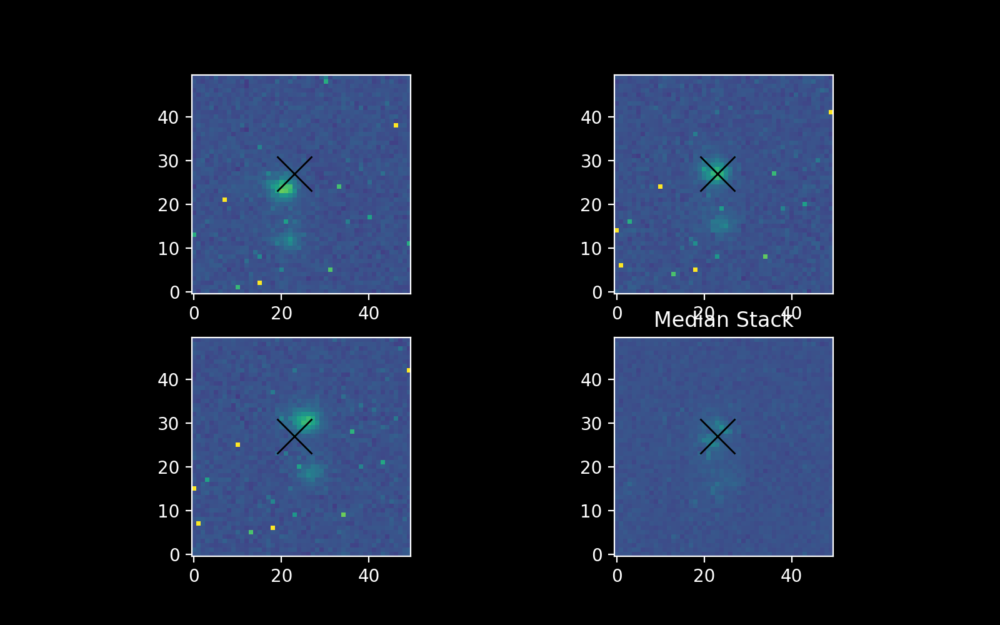

Text(0.5, 1.0, 'Median Stack')

In [26]:
pl.figure(figsize=(8,5))

for ii in range(3):
    ax = pl.subplot(2,2,ii+1)
    ax.imshow(rolled_images[ii][320:370,360:410], origin='lower', vmax=750, vmin=0)
    ax.plot(23, 27, 'kx', markersize=20)

ax = pl.subplot(2,2,4)
ax.imshow(rolled_median[320:370,360:410], origin='lower', vmax=750, vmin=0)
ax.plot(23, 27, 'kx', markersize=20)

ax.set_title("Median Stack")

Let's compare the original, raw median to the new, rolled median:

<IPython.core.display.Javascript object>


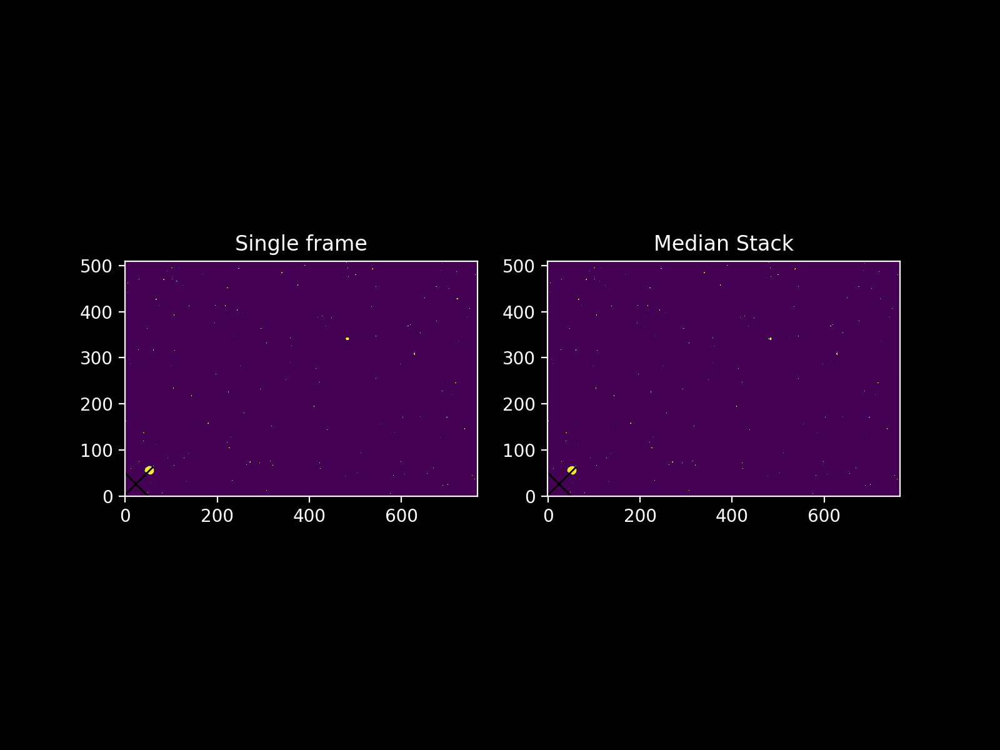

In [27]:
pl.figure(figsize=(8,6))
ax = pl.subplot(1,2,1)
ax.imshow(raw_median_combined_images[320:370,360:410], origin='lower', vmax=2400, vmin=1750)
ax.plot(23, 27, 'kx', markersize=20)

ax = pl.subplot(1,2,2)
ax.imshow(rolled_median[320:370,360:410], origin='lower', vmax=750, vmin=0)
ax.plot(23, 27, 'kx', markersize=20)



Note the biggest difference: those hot pixels are gone!
    
Because the hot pixels are all at the same location, and we shifted the images, the median combination removed them all as they are all outliers!

# Exercises <a name="Exercise1"></a>

[Index](#Index)

## Exercise 1:

Repeat the above process (i.e., shifting & stacking) for the I-band data.

Use the V-band median image as your reference!

In [28]:
filenames = glob.glob("StarsNearNGCTopLeft_I*.FIT")
images1 = [fits.getdata(fn) for fn in filenames]
raw_median_combined_imagesI = np.median(images1, axis=0)

In [29]:
pl.subplot(1, 2, 1) 
pl.imshow(images1[1], origin='lower', vmax=2170, vmin=1860)  # Plot image
pl.title("Single frame")
pl.subplot(1, 2, 2)
pl.imshow(raw_median_combined_imagesI, origin='lower', vmax=2170, vmin=1860)
pl.title("Median Stack")

Text(0.5, 1.0, 'Median Stack')

<IPython.core.display.Javascript object>


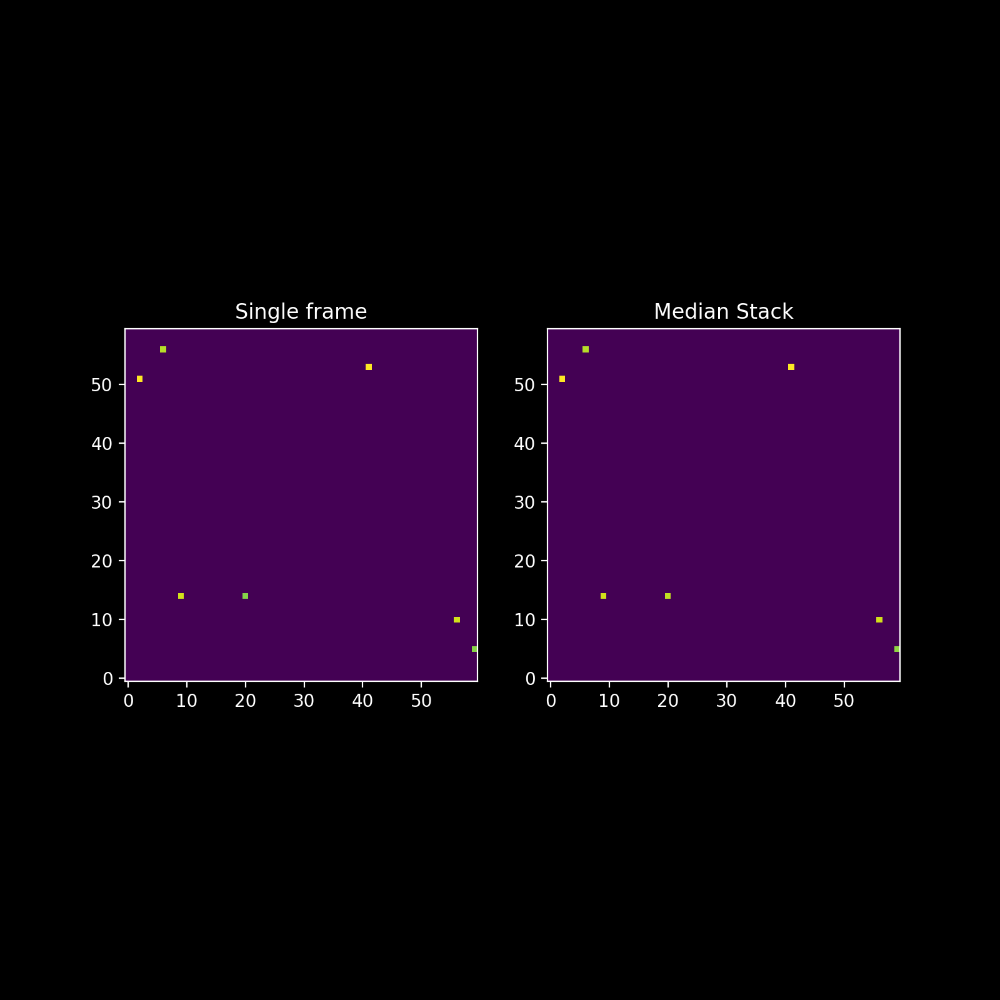

Text(0.5, 1.0, 'Median Stack')

In [30]:
pl.figure(figsize=(8,8))
pl.subplot(1,2,1).imshow(images1[1][120:180,600:660], origin='lower', vmax=2170, vmin=1860)
pl.title("Single frame")

pl.subplot(1,2,2).imshow(raw_median_combined_imagesI[120:180,600:660], origin='lower', vmax=2170, vmin=1860)
pl.title("Median Stack")


<IPython.core.display.Javascript object>


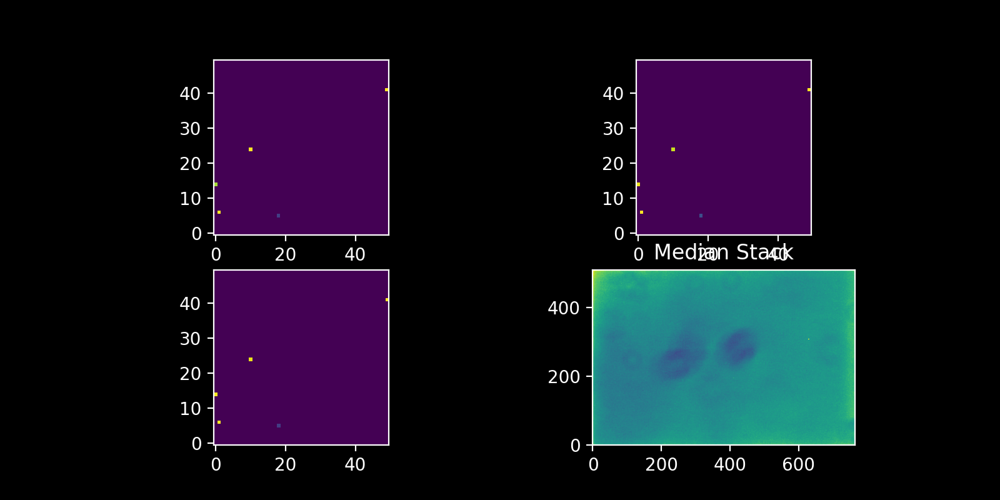

Text(0.5, 1.0, 'Median Stack')

In [31]:
pl.figure(figsize=(8,4))

for ii in range(3):
    pl.subplot(2,2,ii+1).imshow(images1[ii][320:370,360:410], origin='lower', vmax=2170, vmin=1860)

pl.subplot(2,2,4).imshow(raw_median_combined_imagesI[320:370,360:410], origin='lower', vmax=2170, vmin=1860)
pl.title("Median Stack")

In [32]:
dark_30s_filenames = glob.glob('Dark_30s_02*FIT')
flat_I_filenames = glob.glob('Flats_I_10s_*FIT')
bias_filenames = glob.glob('Bias_02*FIT')

In [33]:
average_flat_I = np.mean([fits.getdata(fn) for fn in flat_I_filenames], axis=0)
average_flat_I_biassub = average_flat_I - median_bias
average_flat_I_biassub_norm = average_flat_I_biassub / average_flat_I_biassub.mean()

In [34]:
pl.imshow(average_flat_I_biassub_norm, origin='lower', vmin=0.95, vmax=1.05)

In [35]:
darksub_science_images1 = [im - median_dark_30s for im in images]
flat_darksub_science_images1 = [im / average_flat_I_biassub_norm for im in darksub_science_images1]
processed_median_combined_images1 = np.median(flat_darksub_science_images1, axis=0)

<IPython.core.display.Javascript object>


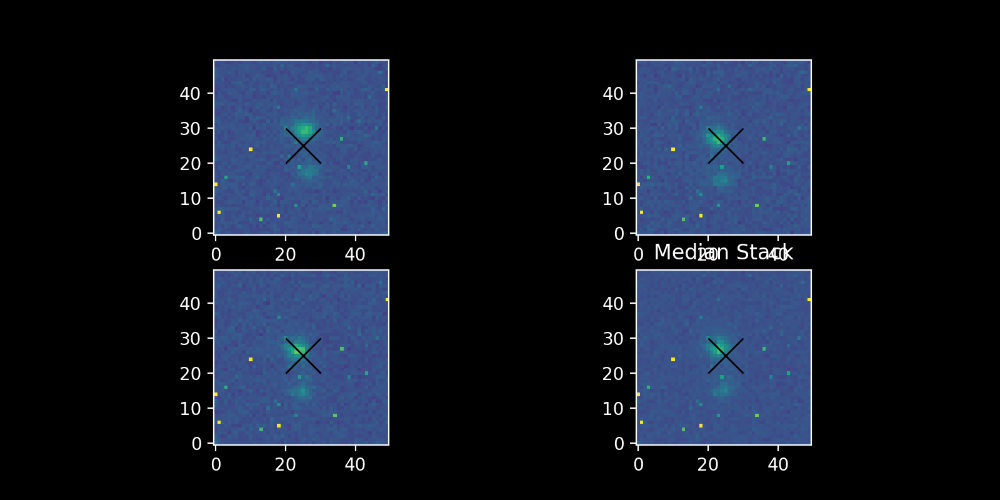

Text(0.5, 1.0, 'Median Stack')

In [36]:
pl.figure(figsize=(8,4))

for ii in range(3):
    ax = pl.subplot(2,2,ii+1)
    ax.imshow(flat_darksub_science_images1[ii][320:370,360:410], origin='lower', vmax=750, vmin=0)
    ax.plot(25, 25, 'kx', markersize=20)
ax = pl.subplot(2,2,4)
ax.imshow(processed_median_combined_images1[320:370,360:410], origin='lower', vmax=750, vmin=0)
ax.plot(25, 25, 'kx', markersize=20)
ax.set_title("Median Stack")

<IPython.core.display.Javascript object>


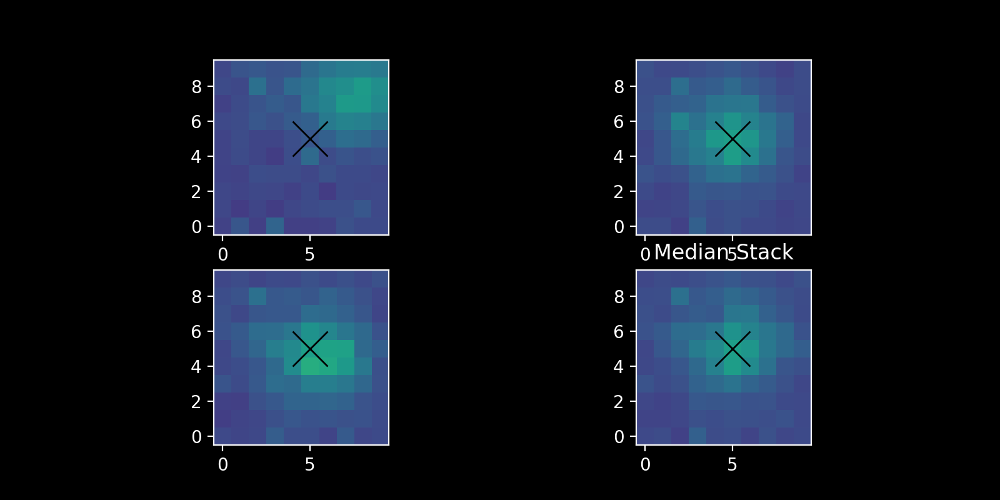

Text(0.5, 1.0, 'Median Stack')

In [37]:
pl.figure(figsize=(8,4))
for ii in range(3):
    ax = pl.subplot(2,2,ii+1)
    ax.imshow(flat_darksub_science_images1[ii][342:352,378:388], origin='lower', vmax=930, vmin=0)
    ax.plot(5, 5, 'kx', markersize=20)
ax = pl.subplot(2,2,4)
ax.imshow(processed_median_combined_images1[342:352,378:388], origin='lower', vmax=930, vmin=0)
ax.plot(5, 5, 'kx', markersize=20)

ax.set_title("Median Stack")

In [38]:
#for image zero, the top-left image, we "roll" back three pixels in each dimension
im00 = np.roll(np.roll(flat_darksub_science_images1[2], -3, axis=0), -3, axis=1)
im11 = flat_darksub_science_images1[1] # this is our "reference image", it stays put

In [39]:
# the bottom-left image, im2, only needs to "roll" on the Y-axis
im22 = np.roll(flat_darksub_science_images1[0], 1, axis=0)
rolled_images1 = [im00,im11,im22]
rolled_median1 = np.median(rolled_images1, axis=0)


<IPython.core.display.Javascript object>


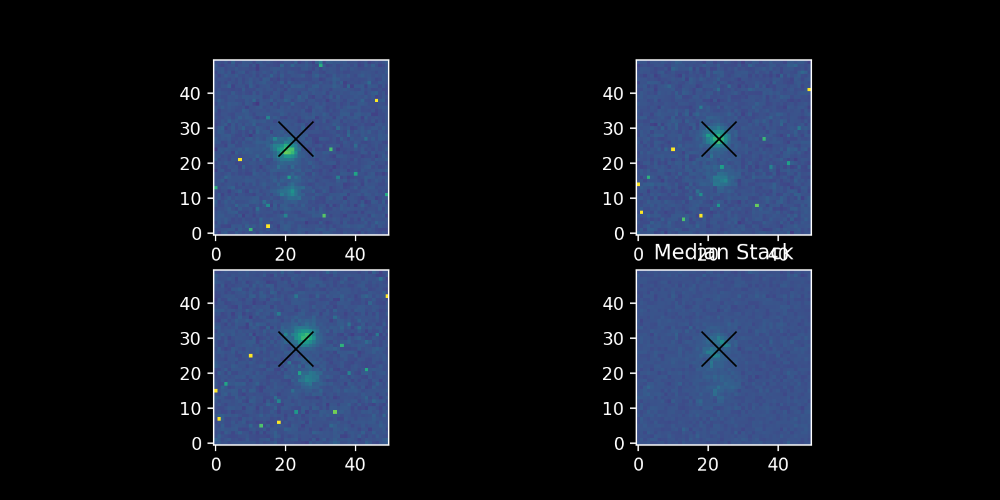

Text(0.5, 1.0, 'Median Stack')

In [40]:
pl.figure(figsize=(8,4))

for ii in range(3):
    ax = pl.subplot(2,2,ii+1)
    ax.imshow(rolled_images1[ii][320:370,360:410], origin='lower', vmax=750, vmin=0)
    ax.plot(23, 27, 'kx', markersize=20)
ax = pl.subplot(2,2,4)
ax.imshow(rolled_median1[320:370,360:410], origin='lower', vmax=750, vmin=0)
ax.plot(23, 27, 'kx', markersize=20)
ax.set_title("Median Stack")


<IPython.core.display.Javascript object>


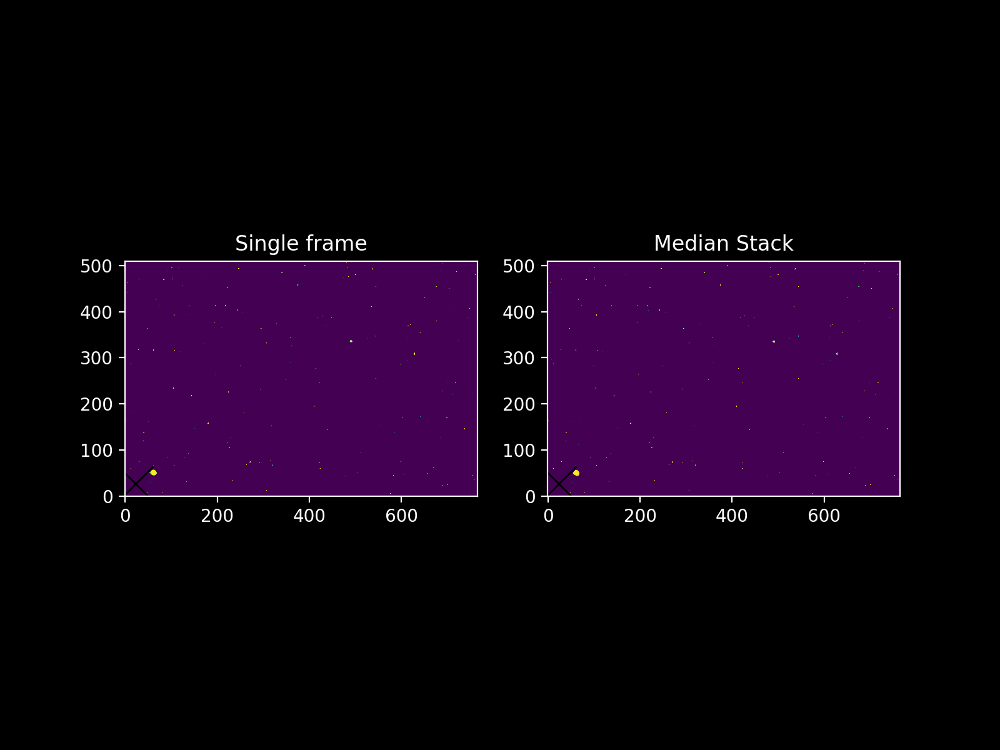

In [41]:
pl.figure(figsize=(8,6))
ax = pl.subplot(1,2,1)
ax.imshow(raw_median_combined_imagesI[320:370,360:410], origin='lower', vmax=2400, vmin=1750)
ax.plot(23, 27, 'kx', markersize=20)

ax = pl.subplot(1,2,2)
ax.imshow(rolled_median1[320:370,360:410], origin='lower', vmax=750, vmin=0)
ax.plot(23, 27, 'kx', markersize=20)


## Exercise 2: 

Repeat again for B-band



In [42]:
filenames = glob.glob("StarsNearNGCTopLeft_B*.FIT")
images2 = [fits.getdata(fn) for fn in filenames]
raw_median_combined_imagesB = np.median(images2, axis=0)

In [43]:
pl.subplot(1, 2, 1) 
pl.imshow(images2[1], origin='lower', vmax=2170, vmin=1860)  # Plot image
pl.title("Single frame")
pl.subplot(1, 2, 2)
pl.imshow(raw_median_combined_imagesB, origin='lower', vmax=2170, vmin=1860)
pl.title("Median Stack")

Text(0.5, 1.0, 'Median Stack')

<IPython.core.display.Javascript object>


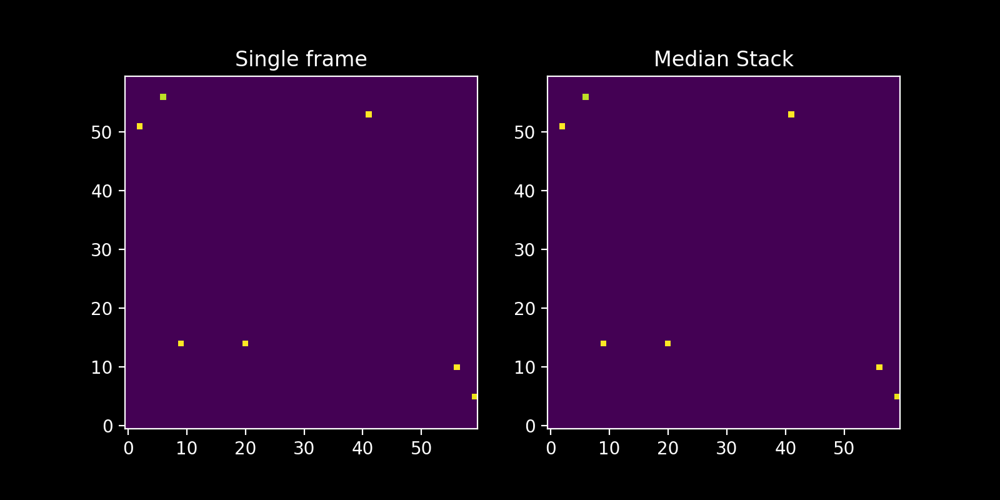

Text(0.5, 1.0, 'Median Stack')

In [44]:
pl.figure(figsize=(8,4))
pl.subplot(1,2,1).imshow(images2[1][120:180,600:660], origin='lower', vmax=2170, vmin=1860)
pl.title("Single frame")
pl.subplot(1,2,2).imshow(raw_median_combined_imagesB[120:180,600:660], origin='lower', vmax=2170, vmin=1860)
pl.title("Median Stack")

<IPython.core.display.Javascript object>


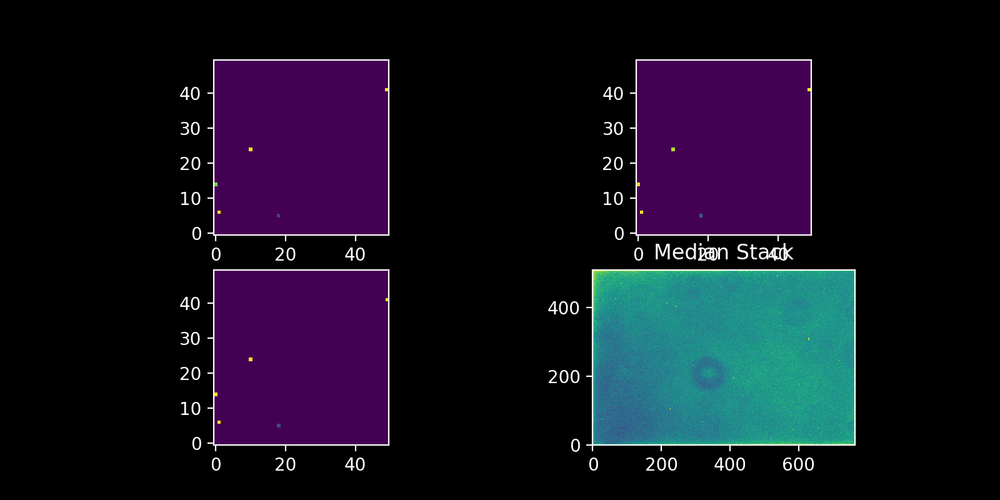

Text(0.5, 1.0, 'Median Stack')

In [45]:
pl.figure(figsize=(8,4))
for ii in range(3):
    pl.subplot(2,2,ii+1).imshow(images2[ii][320:370,360:410], origin='lower', vmax=2170, vmin=1860)
pl.subplot(2,2,4).imshow(raw_median_combined_imagesB[320:370,360:410], origin='lower', vmax=2170, vmin=1860)
pl.title("Median Stack")

In [46]:
dark_30s_filenames = glob.glob('Dark_30s_02*FIT')
flat_B_filenames = glob.glob('Flats_B_10s_*FIT')
bias_filenames = glob.glob('Bias_02*FIT')

In [47]:
average_flat_B = np.mean([fits.getdata(fn) for fn in flat_B_filenames], axis=0)
average_flat_B_biassub = average_flat_B - median_bias
average_flat_B_biassub_norm = average_flat_B_biassub / average_flat_B_biassub.mean()


In [48]:
pl.imshow(average_flat_B_biassub_norm, origin='lower', vmin=0.95, vmax=1.05)

In [49]:
darksub_science_imagesB = [im - median_dark_30s for im in images]
flat_darksub_science_images2 = [im / average_flat_B_biassub_norm for im in darksub_science_imagesB]
processed_median_combined_images2 = np.median(flat_darksub_science_images2, axis=0)


<IPython.core.display.Javascript object>


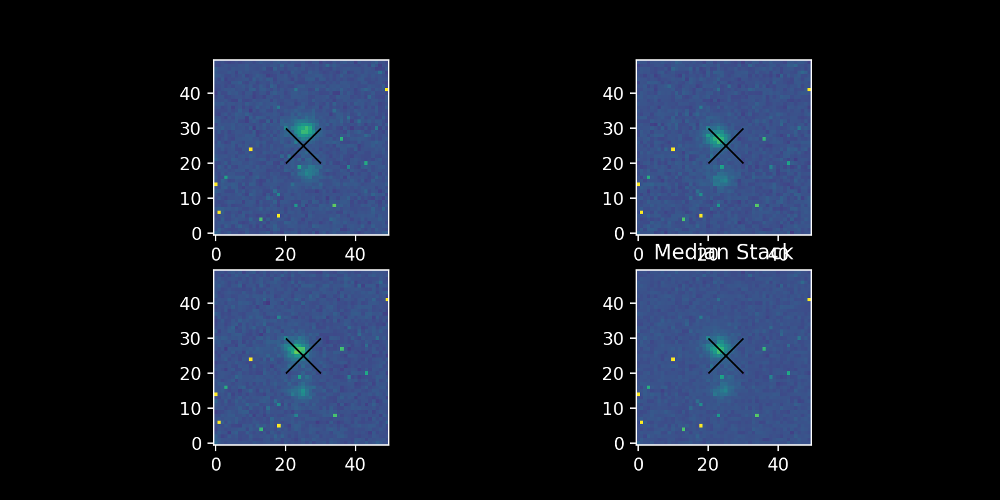

Text(0.5, 1.0, 'Median Stack')

In [50]:
pl.figure(figsize=(8,4))
for ii in range(3):
    ax = pl.subplot(2,2,ii+1)
    ax.imshow(flat_darksub_science_images2[ii][320:370,360:410], origin='lower', vmax=750, vmin=0)
    ax.plot(25, 25, 'kx', markersize=20)
ax = pl.subplot(2,2,4)
ax.imshow(processed_median_combined_images2[320:370,360:410], origin='lower', vmax=750, vmin=0)
ax.plot(25, 25, 'kx', markersize=20)
ax.set_title("Median Stack")

<IPython.core.display.Javascript object>


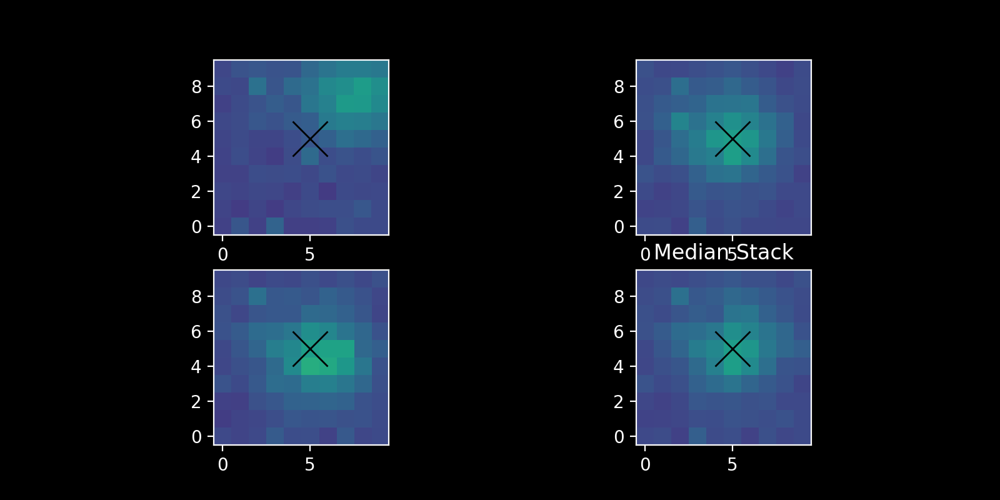

Text(0.5, 1.0, 'Median Stack')

In [51]:
pl.figure(figsize=(8,4))
for ii in range(3):
    ax = pl.subplot(2,2,ii+1)
    ax.imshow(flat_darksub_science_images2[ii][342:352,378:388], origin='lower', vmax=930, vmin=0)
    ax.plot(5, 5, 'kx', markersize=20)
ax = pl.subplot(2,2,4)
ax.imshow(processed_median_combined_images2[342:352,378:388], origin='lower', vmax=930, vmin=0)
ax.plot(5, 5, 'kx', markersize=20)
ax.set_title("Median Stack")

In [52]:
im000 = np.roll(np.roll(flat_darksub_science_images2[2], -3, axis=0), -3, axis=1)
im111 = flat_darksub_science_images2[1] # this is our "reference image", it stays put


In [53]:
im222 = np.roll(flat_darksub_science_images2[0], 1, axis=0)
rolled_images2 = [im000,im111,im222]
rolled_median2 = np.median(rolled_images2, axis=0)


<IPython.core.display.Javascript object>


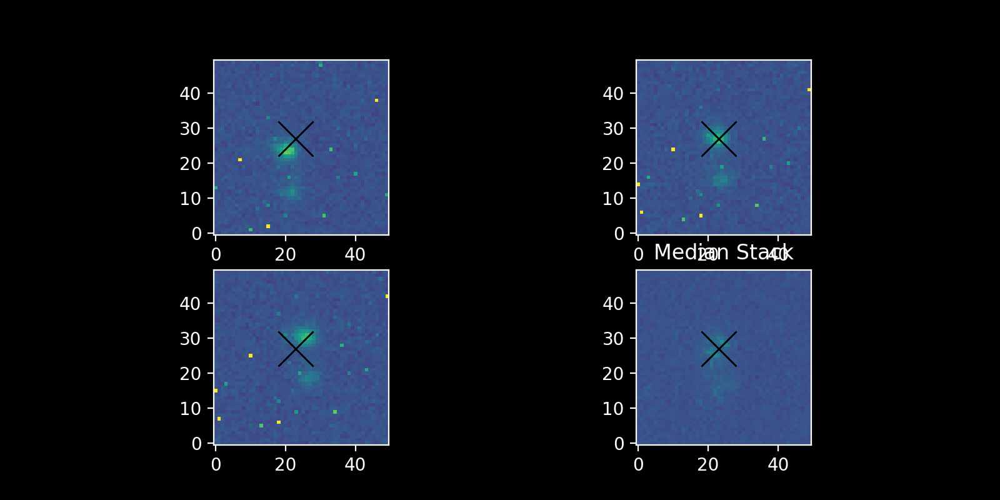

Text(0.5, 1.0, 'Median Stack')

In [54]:
pl.figure(figsize=(8,4))
for ii in range(3):
    ax = pl.subplot(2,2,ii+1)
    ax.imshow(rolled_images2[ii][320:370,360:410], origin='lower', vmax=750, vmin=0)
    ax.plot(23, 27, 'kx', markersize=20)
ax = pl.subplot(2,2,4)
ax.imshow(rolled_median2[320:370,360:410], origin='lower', vmax=750, vmin=0)
ax.plot(23, 27, 'kx', markersize=20)
ax.set_title("Median Stack")

/var/folders/ct/3p6ngzhj6xbcrqtyd_rkdsn00000gn/T/ipykernel_2850/1047265397.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  pl.figure(figsize=(8,4))


<IPython.core.display.Javascript object>


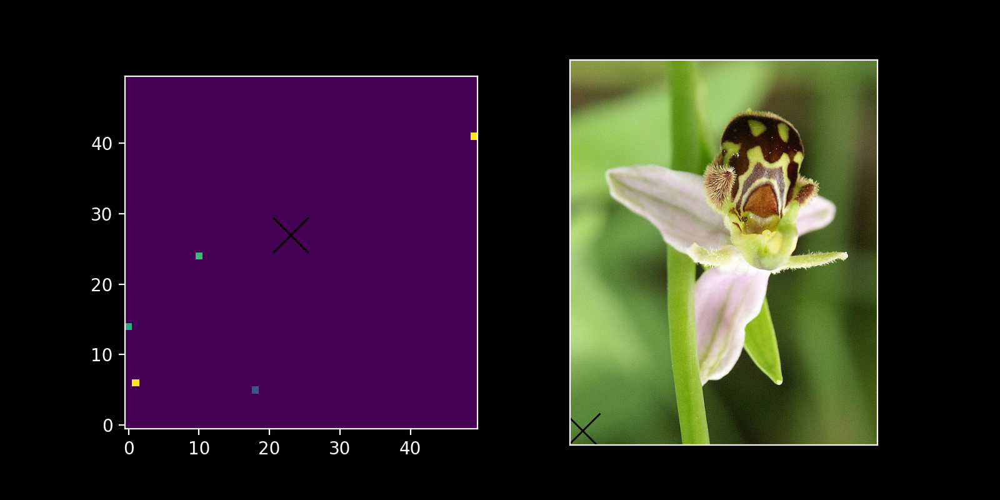

In [55]:
pl.figure(figsize=(8,4))
ax = pl.subplot(1,2,1)
ax.imshow(raw_median_combined_imagesB[320:370,360:410], origin='lower', vmax=2400, vmin=1750)
ax.plot(23, 27, 'kx', markersize=20)

ax = pl.subplot(1,2,2)
ax.imshow(rolled_median2[320:370,360:410], origin='lower', vmax=750, vmin=0)
ax.plot(23, 27, 'kx', markersize=20)

# RGB Images <a name="RGB_Images"></a>

[Index](#Index)

Color images are composites of monochromatic frames seen through different colors.

In [56]:
import pylab as plt

In [57]:
import matplotlib
import numpy as np

In [58]:
# download a file
from urllib.request import urlretrieve
import shutil
path,msg = urlretrieve('https://upload.wikimedia.org/wikipedia/commons/f/f5/Ophrys_apifera_flower1.jpg')
shutil.move(path, 'Ophrys_apifera_flower1.jpg')

'Ophrys_apifera_flower1.jpg'

__Question:__ Where is this image stored on your computer?

__Answer:__It got uploaded into my obs_tech folder, where this notebook is located.

In [59]:
flower_image = plt.imread('Ophrys_apifera_flower1.jpg')

In [60]:
plt.imshow(flower_image)
plt.xticks([]); plt.yticks([])

([], [])

In [61]:
flower_image.shape

(745, 595, 3)

In [62]:
# decompose the three channels into their respective images
red = flower_image[:,:,0]
green = flower_image[:,:,1]
blue = flower_image[:,:,2]

<IPython.core.display.Javascript object>


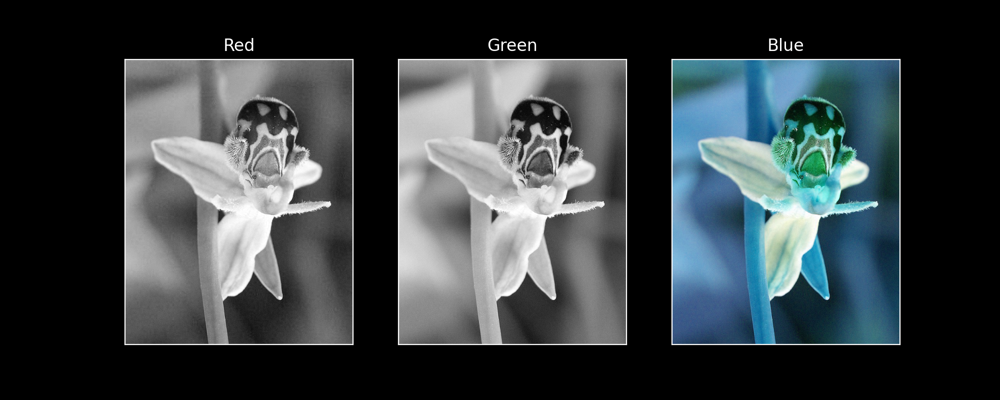

In [63]:
_=plt.figure(figsize=(10,4))
_=plt.subplot(1,3,1).imshow(red, cmap='gray')
_=plt.xticks([]); plt.yticks([])
_=plt.title("Red")
_=plt.subplot(1,3,2).imshow(green, cmap='gray')
_=plt.xticks([]); plt.yticks([])
_=plt.title("Green")
_=plt.subplot(1,3,3).imshow(blue, cmap='gray')
_=plt.xticks([]); plt.yticks([])
_=plt.title("Blue")

In [64]:
# compose the three channels back into an RGB image
_=plt.imshow(np.dstack([red,green,blue]))
_=plt.xticks([]); _=plt.yticks([])


In [65]:
# compose the three channels back into an RGB image, but with colors swapped
_=plt.imshow(np.dstack([green,blue,red]))
_=plt.xticks([]); _=plt.yticks([])

In [66]:
# compose the three channels back into an RGB image, but with colors swapped again
_=plt.imshow(np.dstack([blue,red,green]))
_=plt.xticks([]); _=plt.yticks([])

# Exercises <a name="Exercise2"></a>

[Index](#Index)

## Exercise 1
Give a brief (1-2 sentence) explanation of 5 things you need consider when trying to make a color image that looks nice.


Answer: When making a color image the first thing you need to consider is that it is uploaded properly as an image that can be decomposed, you need to consider the three channels that decompose the image into their respective colors and you need to consider the color scaling and it fitting to the images and then have a reference image to compare back to. 

## Exercise 2
Repeat the above process (i.e., create an RGB image) for data that you have now aligned and stacked.

<IPython.core.display.Javascript object>


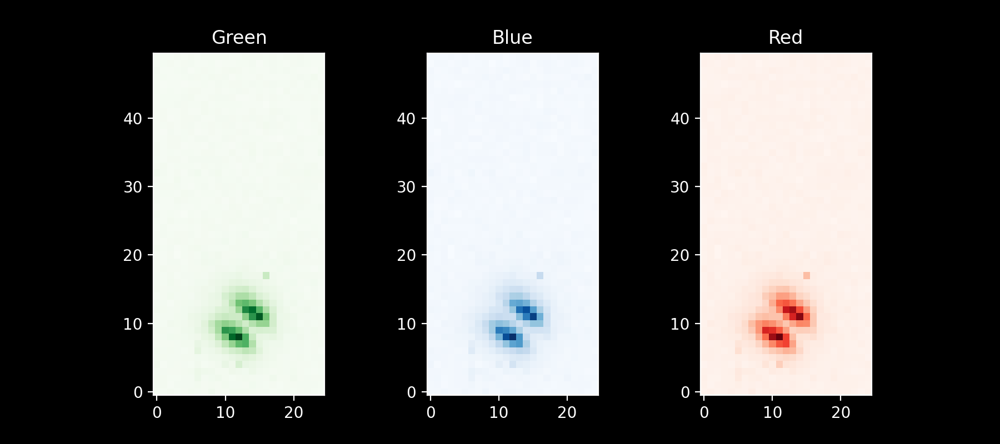

<IPython.core.display.Javascript object>


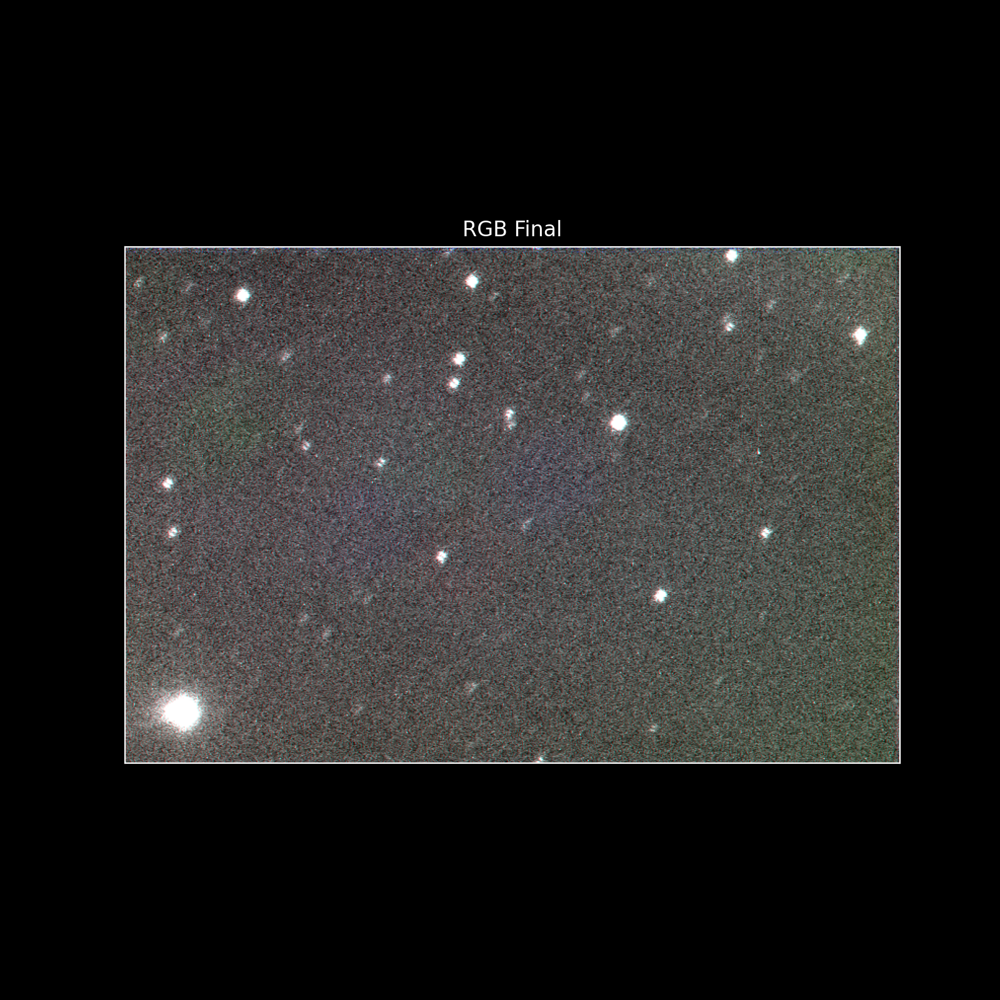

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [67]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.visualization import ImageNormalize, ZScaleInterval
#I had to work with Carli in my group back and forth for fixing this code, I also
#spoke to Ben about my issue as well. 

Vroll = np.roll(np.roll(rolled_median, -3, axis=0), -3, axis=1)  # Green
Iroll = np.roll(np.roll(rolled_median2, -3, axis=0), -4, axis=1)  # Red
Broll = np.roll(np.roll(rolled_median1, -3, axis=0), -3, axis=1)  # Blue


norm_I = ImageNormalize(Iroll, interval=ZScaleInterval())
norm_V = ImageNormalize(Vroll, interval=ZScaleInterval())
norm_B = ImageNormalize(Broll, interval=ZScaleInterval())


Ialign = (Iroll - norm_I.vmin) / (norm_I.vmax - norm_I.vmin)
Valign = (Vroll - norm_V.vmin) / (norm_V.vmax - norm_V.vmin)
Balign = (Broll - norm_B.vmin) / (norm_B.vmax - norm_B.vmin)


ymin, ymax = 325, 375
xmin, xmax = 475, 500


Vzoom = Valign[ymin:ymax, xmin:xmax]
Izoom = Ialign[ymin:ymax, xmin:xmax]
Bzoom = Balign[ymin:ymax, xmin:xmax]


fig, axes = plt.subplots(1, 3, figsize=(9, 4))
axes[0].imshow(Vzoom, cmap='Greens', origin='lower')
axes[0].set_title('Green')
axes[1].imshow(Bzoom, cmap='Blues', origin='lower')
axes[1].set_title('Blue')
axes[2].imshow(Izoom, cmap='Reds', origin='lower') 
axes[2].set_title('Red')  

plt.show()

rgb_image_norm = np.dstack([Ialign, Valign, Balign])

plt.figure(figsize=(8, 8))
plt.imshow(rgb_image_norm, origin='lower')
plt.xticks([])
plt.yticks([])
plt.title('RGB Final')
plt.show()


## Extra Credit Exercise

Make a 3-color image (e.g. B,V,R) for one of the data sets you collected during your observing session! (Don't forget to align and stack these as well). 

In [68]:
import glob
from astropy.io import fits

folder_path = "/Users/zeinakellybenton/Desktop/2025-02-17_20_38_05Z" 

filenamesV = glob.glob(f"{folder_path}/Light_darks_0.01sec_Bin2_filter-V*.fit")


imagesV = [fits.getdata(fn) for fn in filenamesV]
filenamesV

['/Users/zeinakellybenton/Desktop/2025-02-17_20_38_05Z/Light_darks_0.01sec_Bin2_filter-V_-4.9C_gain0_2025-02-17_203817_frame0001.fit',
 '/Users/zeinakellybenton/Desktop/2025-02-17_20_38_05Z/Light_darks_0.01sec_Bin2_filter-V_-4.9C_gain0_2025-02-17_203818_frame0003.fit',
 '/Users/zeinakellybenton/Desktop/2025-02-17_20_38_05Z/Light_darks_0.01sec_Bin2_filter-V_-4.9C_gain0_2025-02-17_203818_frame0002.fit']

In [69]:
folder_path = "/Users/zeinakellybenton/Desktop/2025-02-17_20_38_05Z" 

filenamesR = glob.glob(f"{folder_path}/Dark_darks_0.01sec_Bin2_filter-I*.fit")


imagesR = [fits.getdata(fn) for fn in filenamesR]
filenamesR

['/Users/zeinakellybenton/Desktop/2025-02-17_20_38_05Z/Dark_darks_0.01sec_Bin2_filter-I_-4.9C_gain0_2025-02-17_203825_frame0001.fit',
 '/Users/zeinakellybenton/Desktop/2025-02-17_20_38_05Z/Dark_darks_0.01sec_Bin2_filter-I_-4.9C_gain0_2025-02-17_203825_frame0002.fit',
 '/Users/zeinakellybenton/Desktop/2025-02-17_20_38_05Z/Dark_darks_0.01sec_Bin2_filter-I_-4.9C_gain0_2025-02-17_203826_frame0003.fit']

In [70]:
folder_path = "/Users/zeinakellybenton/Desktop/2025-02-17_20_38_05Z" 

filenamesB = glob.glob(f"{folder_path}/Light_darks_0.01sec_Bin2_filter-B*.fit")


imagesB = [fits.getdata(fn) for fn in filenamesB]
filenamesB

['/Users/zeinakellybenton/Desktop/2025-02-17_20_38_05Z/Light_darks_0.01sec_Bin2_filter-B_-4.9C_gain0_2025-02-17_203813_frame0001.fit',
 '/Users/zeinakellybenton/Desktop/2025-02-17_20_38_05Z/Light_darks_0.01sec_Bin2_filter-B_-4.9C_gain0_2025-02-17_203814_frame0003.fit',
 '/Users/zeinakellybenton/Desktop/2025-02-17_20_38_05Z/Light_darks_0.01sec_Bin2_filter-B_-4.9C_gain0_2025-02-17_203814_frame0002.fit']

In [71]:
raw_median_combined_imagesR = np.median(imagesR, axis=0)
raw_median_combined_imagesV = np.median(imagesV, axis=0)
raw_median_combined_imagesB = np.median(imagesB, axis=0)

In [72]:
folder_pathD = "/Users/zeinakellybenton/Desktop/DARKS" 
folder_pathB=  "/Users/zeinakellybenton/Desktop/2025-02-17_17_56_29Z"
folder_pathFB= "/Users/zeinakellybenton/Desktop/b filter"
folder_pathFV= "/Users/zeinakellybenton/Desktop/2025-02-17_18_00_55Z"
folder_pathFR= "/Users/zeinakellybenton/Desktop/2025-02-17_18_02_28Z"

dark_filenames = glob.glob(f"{folder_pathD}/Dark_darks_0.01sec_Bin2_filter-Clear_-5.8C_gain0*fit")
bias_filenames = glob.glob(f"{folder_pathB}/Bias_darks_0sec_Bin2_filter-Clear*fit")


flatB = glob.glob(f"{folder_pathFB}/Flat_darks_0.25sec_Bin2_filter-B*fit")
flatR = glob.glob(f"{folder_pathFR}/Flat_darks_15sec_Bin2_filter-I_*fit")
flatV = glob.glob(f"{folder_pathFV}/Flat_darks_0.4sec_Bin2_filter-V*fit")


In [73]:
medianbias = np.median([fits.getdata(fn) for fn in bias_filenames], axis=0)
median_dark = np.median([fits.getdata(fn) for fn in dark_filenames], axis=0)


In [74]:
average_flatB = np.mean([fits.getdata(fn) for fn in flatB], axis=0)
average_flatB_biassub = average_flatB - medianbias
average_flatB_biassub_norm = average_flatB_biassub / average_flatB_biassub.mean()

average_flatR = np.mean([fits.getdata(fn) for fn in flatR], axis=0)
average_flatR_biassub = average_flatR - medianbias
average_flatR_biassub_norm = average_flatR_biassub / average_flatR_biassub.mean()

average_flatV = np.mean([fits.getdata(fn) for fn in flatV], axis=0)
average_flatV_biassub = average_flatV - medianbias
average_flatV_biassub_norm = average_flatV_biassub / average_flatV_biassub.mean()

In [75]:
darksub_scienceB = [im - median_dark for im in imagesB]
flat_darksub_science_imagesB = [im / average_flatB_biassub_norm for im in darksub_scienceB]
processed_median_combined_imagesB = np.median(flat_darksub_science_imagesB, axis=0)


darksub_scienceV = [im - median_dark for im in imagesV]
flat_darksub_science_imagesV = [im / average_flatV_biassub_norm for im in darksub_scienceV]
processed_median_combined_imagesV = np.median(flat_darksub_science_imagesV, axis=0)

darksub_scienceR = [im - median_dark for im in imagesR]
flat_darksub_science_imagesR = [im / average_flatR_biassub_norm for im in darksub_scienceR]
processed_median_combined_imagesR = np.median(flat_darksub_science_imagesR, axis=0)

<IPython.core.display.Javascript object>


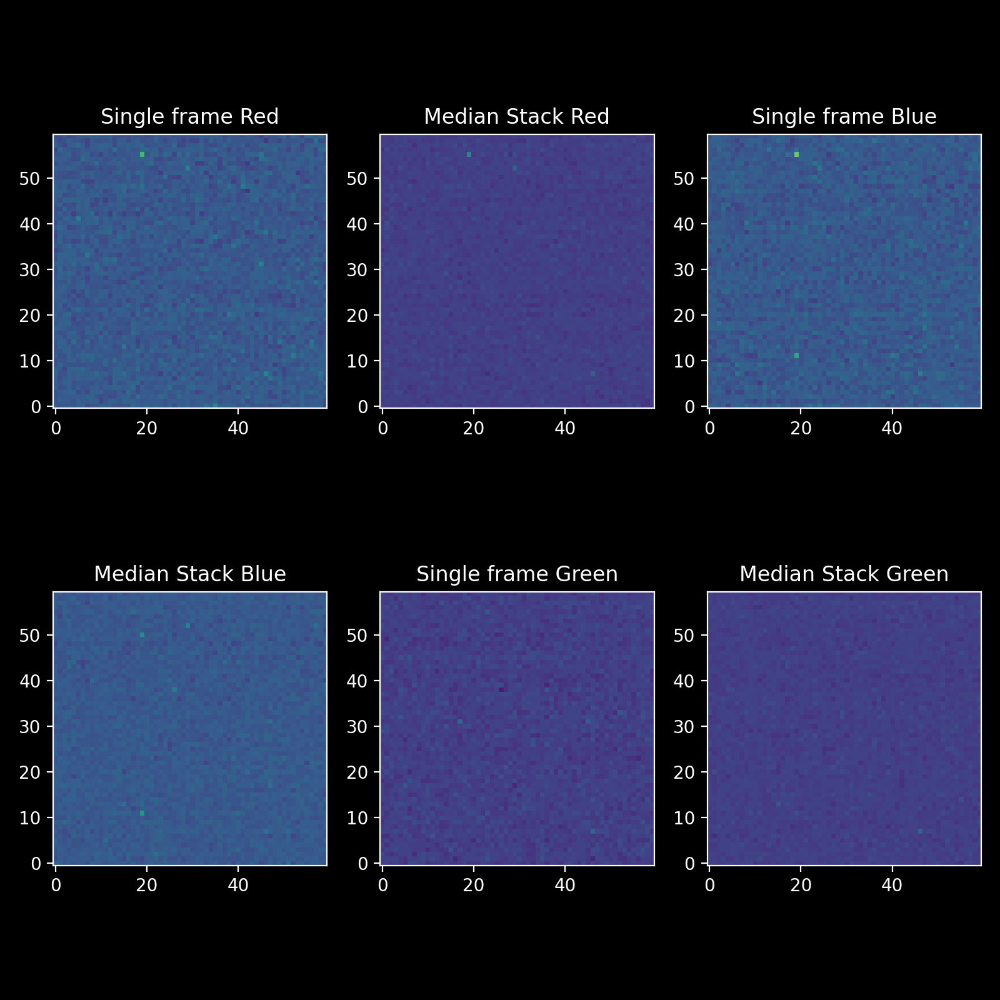

In [76]:
pl.figure(figsize=(8,8))

pl.subplot(2,3,1).imshow(imagesR[1][120:180,600:660], origin='lower', vmax=2070, vmin=1860)
pl.title("Single frame Red")

pl.subplot(2,3,2).imshow(raw_median_combined_imagesR[120:180,600:660], origin='lower', vmax=2170, vmin=1860)
pl.title("Median Stack Red")

pl.subplot(2,3,3).imshow(imagesB[1][120:180,600:660], origin='lower', vmax=2070, vmin=1860)
pl.title("Single frame Blue")

pl.subplot(2,3,4).imshow(raw_median_combined_imagesB[120:180,600:660], origin='lower', vmax=2070, vmin=1860)
pl.title("Median Stack Blue")

pl.subplot(2,3,5).imshow(imagesV[1][120:180,600:660], origin='lower', vmax=2170, vmin=1860)
pl.title("Single frame Green")

pl.subplot(2,3,6).imshow(raw_median_combined_imagesV[120:180,600:660], origin='lower', vmax=2170, vmin=1860)
pl.title("Median Stack Green")

pl.tight_layout()  # Prevent overlapping titles




<IPython.core.display.Javascript object>


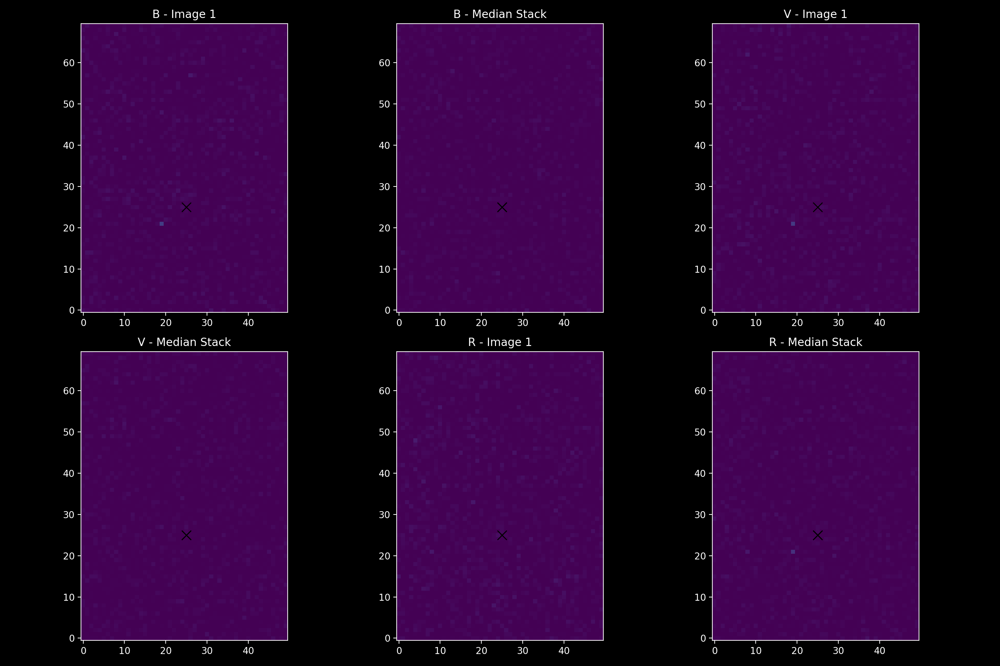

In [77]:
import matplotlib.pyplot as pl

pl.figure(figsize=(15, 10))  # Bigger figure for clarity

filters = ['B', 'V', 'R']
data_dict = {
    'B': (flat_darksub_science_imagesB, processed_median_combined_imagesB),
    'V': (flat_darksub_science_imagesV, processed_median_combined_imagesV),
    'R': (flat_darksub_science_imagesR, processed_median_combined_imagesR),
}

for i, filt in enumerate(filters):
    images, median_image = data_dict[filt]  
    
    for ii in range(2):  
        ax = pl.subplot(2, 3, i * 2 + ii + 1)  
        ax.imshow(images[ii][300:370, 360:410], origin='lower', vmax=550, vmin=0)
        ax.plot(25, 25, 'kx', markersize=10)  
        ax.set_title(f"{filt} - Image {ii+1}")

    
    ax = pl.subplot(2, 3, (i + 1) * 2) 
    ax.imshow(median_image[300:370, 360:410], origin='lower', vmax=550, vmin=0)
    ax.plot(25, 25, 'kx', markersize=10)
    ax.set_title(f"{filt} - Median Stack")

pl.tight_layout() 
pl.show() 



In [78]:
#B
imB0 = np.roll(np.roll(flat_darksub_science_imagesB[2], -3, axis=0), -3, axis=1)
imB1 = flat_darksub_science_imagesB[1] # this is our "reference image", it stays put
imB2 = np.roll(flat_darksub_science_imagesB[0], 1, axis=0)
rolled_imagesB = [imB0,imB1,imB2]
rolled_medianB = np.median(rolled_imagesB, axis=0)


#V
imV0 = np.roll(np.roll(flat_darksub_science_imagesV[2], -3, axis=0), -3, axis=1)
imV1 = flat_darksub_science_imagesV[1] # this is our "reference image", it stays put
imV2 = np.roll(flat_darksub_science_imagesV[0], 1, axis=0)
rolled_imagesV = [imV0,imV1,imV2]
rolled_medianV = np.median(rolled_imagesV, axis=0)

#I
imR0 = np.roll(np.roll(flat_darksub_science_imagesR[2], -3, axis=0), -3, axis=1)
imR1 = flat_darksub_science_imagesR[1] # this is our "reference image", it stays put
imR2 = np.roll(flat_darksub_science_imagesR[0], 1, axis=0)
rolled_imagesR = [imR0,imR1,imR1]
rolled_medianR = np.median(rolled_imagesR, axis=0)



<IPython.core.display.Javascript object>


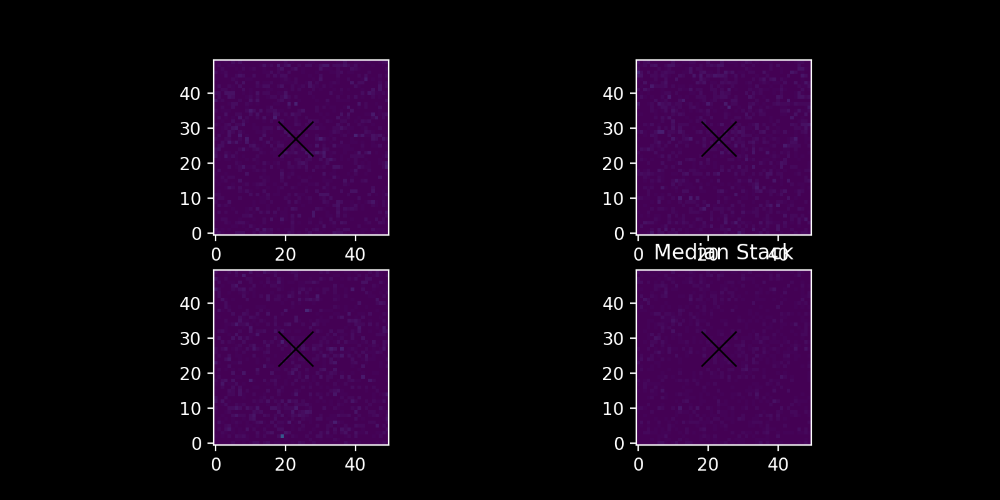

Text(0.5, 1.0, 'Median Stack')

In [79]:
pl.figure(figsize=(8,4))
for ii in range(3):
    ax = pl.subplot(2,2,ii+1)
    ax.imshow(rolled_imagesB[ii][320:370,360:410], origin='lower', vmax=350, vmin=0)
    ax.plot(23, 27, 'kx', markersize=20)
ax = pl.subplot(2,2,4)
ax.imshow(rolled_medianB[320:370,360:410], origin='lower', vmax=350, vmin=0)
ax.plot(23, 27, 'kx', markersize=20)
ax.set_title("Median Stack")

<IPython.core.display.Javascript object>


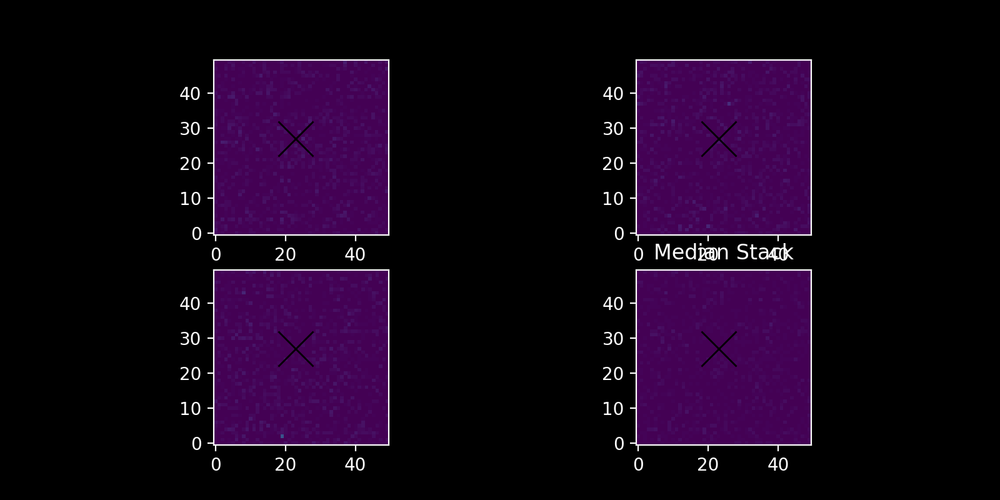

Text(0.5, 1.0, 'Median Stack')

In [80]:
pl.figure(figsize=(8,4))
for ii in range(3):
    ax = pl.subplot(2,2,ii+1)
    ax.imshow(rolled_imagesV[ii][320:370,360:410], origin='lower', vmax=350, vmin=0)
    ax.plot(23, 27, 'kx', markersize=20)
ax = pl.subplot(2,2,4)
ax.imshow(rolled_medianV[320:370,360:410], origin='lower', vmax=350, vmin=0)
ax.plot(23, 27, 'kx', markersize=20)
ax.set_title("Median Stack")

<IPython.core.display.Javascript object>


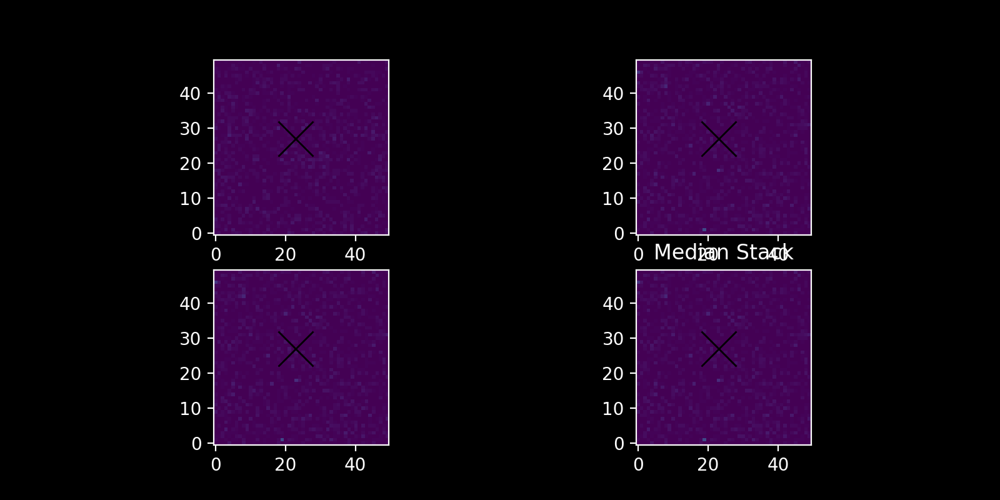

Text(0.5, 1.0, 'Median Stack')

In [81]:
pl.figure(figsize=(8,4))
for ii in range(3):
    ax = pl.subplot(2,2,ii+1)
    ax.imshow(rolled_imagesR[ii][320:370,360:410], origin='lower', vmax=350, vmin=0)
    ax.plot(23, 27, 'kx', markersize=20)
ax = pl.subplot(2,2,4)
ax.imshow(rolled_medianR[320:370,360:410], origin='lower', vmax=350, vmin=0)
ax.plot(23, 27, 'kx', markersize=20)
ax.set_title("Median Stack")

<IPython.core.display.Javascript object>


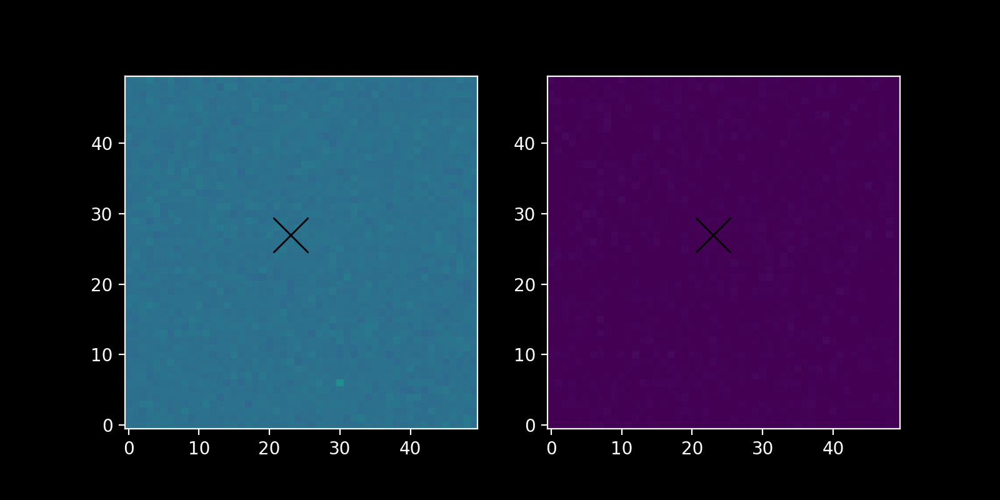

In [82]:
pl.figure(figsize=(8,4))
ax = pl.subplot(1,2,1)
ax.imshow(raw_median_combined_imagesB[320:370,360:410], origin='lower', vmax=2200, vmin=1750)
ax.plot(23, 27, 'kx', markersize=20)
ax = pl.subplot(1,2,2)
ax.imshow(rolled_medianB[320:370,360:410], origin='lower', vmax=750, vmin=0)
ax.plot(23, 27, 'kx', markersize=20)

<IPython.core.display.Javascript object>


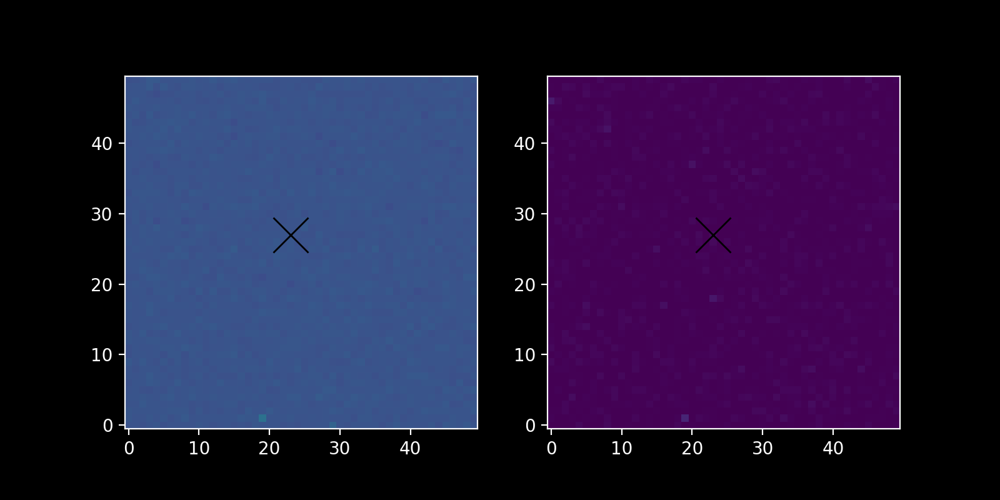

In [83]:
pl.figure(figsize=(8,4))
ax = pl.subplot(1,2,1)
ax.imshow(raw_median_combined_imagesR[320:370,360:410], origin='lower', vmax=2400, vmin=1750)
ax.plot(23, 27, 'kx', markersize=20)
ax = pl.subplot(1,2,2)
ax.imshow(rolled_medianR[320:370,360:410], origin='lower', vmax=750, vmin=0)
ax.plot(23, 27, 'kx', markersize=20)

<IPython.core.display.Javascript object>


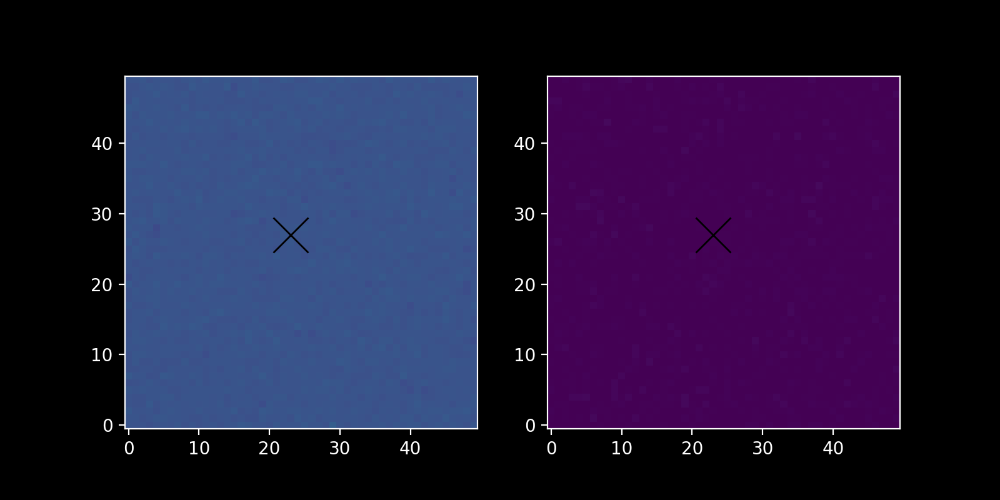

In [84]:
pl.figure(figsize=(8,4))
ax = pl.subplot(1,2,1)
ax.imshow(raw_median_combined_imagesV[320:370,360:410], origin='lower', vmax=2400, vmin=1750)
ax.plot(23, 27, 'kx', markersize=20)
ax = pl.subplot(1,2,2)
ax.imshow(rolled_medianV[320:370,360:410], origin='lower', vmax=750, vmin=0)
ax.plot(23, 27, 'kx', markersize=20)

<IPython.core.display.Javascript object>


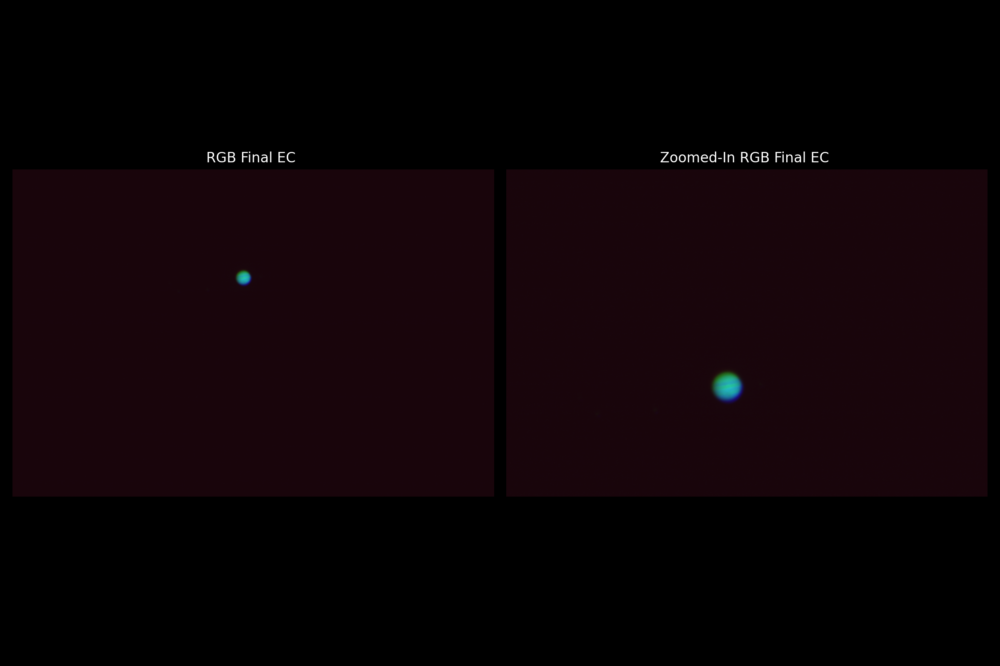

In [112]:
# Here is one way where you can see the stripes!


Vroll = np.roll(np.roll(rolled_medianV, -3, axis=0), -3, axis=1)  # Green
Iroll = np.roll(np.roll(rolled_medianR, -3, axis=0), -4, axis=1)  # Red
Broll = np.roll(np.roll(rolled_medianB, -3, axis=0), -3, axis=1)  # Blue


norm_I = ImageNormalize(Iroll, interval=ZScaleInterval())
norm_V = ImageNormalize(Vroll, interval=ZScaleInterval())
norm_B = ImageNormalize(Broll, interval=ZScaleInterval())


Ialign = (Iroll - np.min(Iroll)) / (np.max(Iroll) - np.min(Iroll))  
Valign = (Vroll - np.min(Vroll)) / (np.max(Vroll) - np.min(Vroll))  
Balign = (Broll - np.min(Broll)) / (np.max(Broll) - np.min(Broll))  

Ialign = Ialign * 0.2  # Reduce red intensity significantly
Valign = Valign * 0.8  # Increase green intensity slightly
Balign = Balign * 0.8


Ialign = np.clip(Ialign, 0, 1)
Valign = np.clip(Valign, 0, 1)
Balign = np.clip(Balign, 0, 1)


rgb_image_norm = np.dstack([Ialign, Valign, Balign])

crop_x_start = rgb_image_norm.shape[1] // 4
crop_x_end = 3 * rgb_image_norm.shape[1] // 4
crop_y_start = rgb_image_norm.shape[0] // 2
crop_y_end = 3 * rgb_image_norm.shape[0] // 2

cropped_image = rgb_image_norm[crop_y_start:crop_y_end, crop_x_start:crop_x_end]

# Display the original image and the zoomed-in image side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 8))


axes[0].imshow(rgb_image_norm, origin='lower')
axes[0].set_title('RGB Final EC ')
axes[0].axis('off')  # Hide axes


axes[1].imshow(cropped_image, origin='lower')
axes[1].set_title('Zoomed-In RGB Final EC ')
axes[1].axis('off')  

plt.tight_layout()
plt.show()


<IPython.core.display.Javascript object>


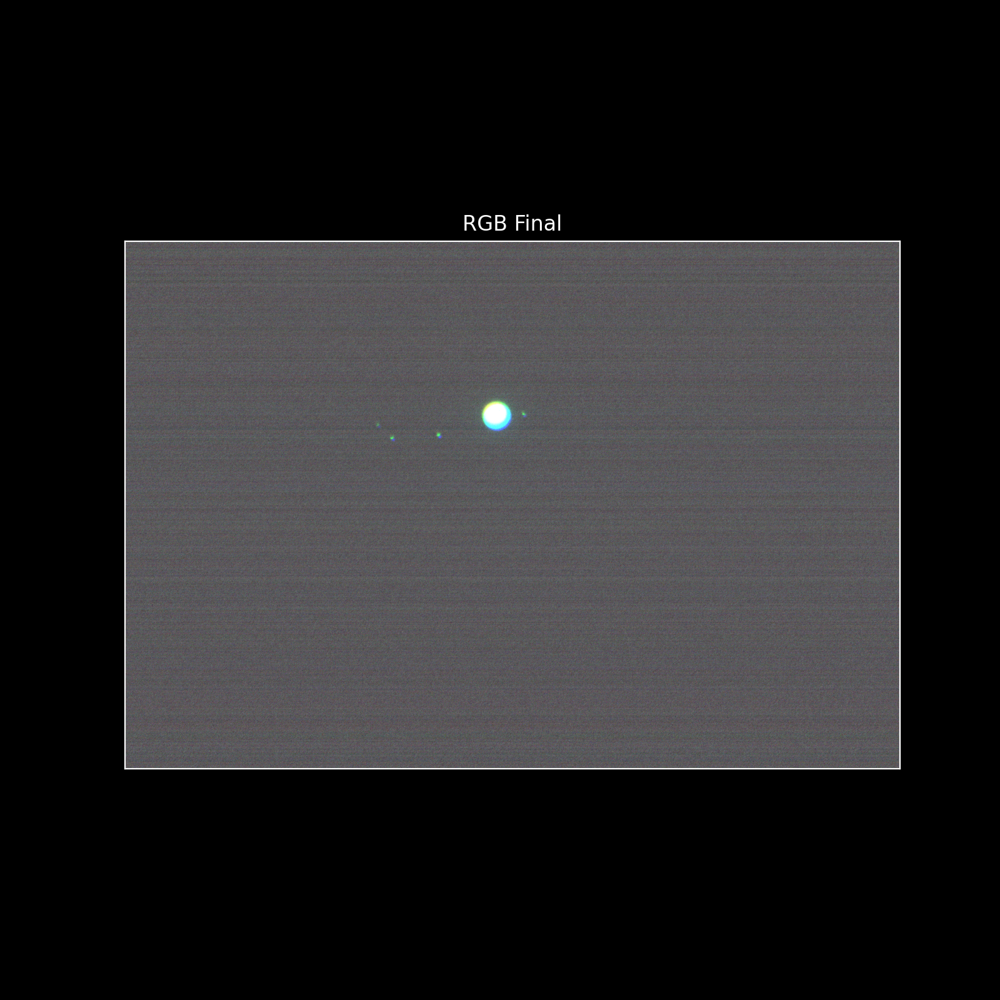

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [101]:
Vroll = np.roll(np.roll(rolled_medianV, -3, axis=0), -3, axis=1)  # Green
Iroll = np.roll(np.roll(rolled_medianR, -3, axis=0), -4, axis=1)  # Red
Broll = np.roll(np.roll(rolled_medianB, -3, axis=0), -3, axis=1) 

norm_I = ImageNormalize(Iroll, interval=ZScaleInterval())
norm_V = ImageNormalize(Vroll, interval=ZScaleInterval())
norm_B = ImageNormalize(Broll, interval=ZScaleInterval())


Ialign = (Iroll - norm_I.vmin) / (norm_I.vmax - norm_I.vmin)
Valign = (Vroll - norm_V.vmin) / (norm_V.vmax - norm_V.vmin)
Balign = (Broll - norm_B.vmin) / (norm_B.vmax - norm_B.vmin)


rgb_image_norm = np.dstack([Ialign, Valign, Balign])

plt.figure(figsize=(8, 8))
plt.imshow(rgb_image_norm, origin='lower')
plt.xticks([])
plt.yticks([])
plt.title('RGB Final')
plt.show()